a. Directory Structure (notebooks for testing and src once build complete)

project/
│
├── notebooks/
│   ├── animate_main.py
│   ├── animate/
│       ├── __init__.py
│       ├── viewpoints.py
│       ├── court.py
│       ├── elements.py
│       ├── animation.py
│       └── angle_meter.py
│
├── src/
│   ├── animate/
│       ├── __init__.py
│       ├── viewpoints.py
│       ├── court.py
│       ├── elements.py
│       ├── animation.py
│       └── angle_meter.py
│
├── data/
│   └── processed/
│       └── final_granular_dataset.csv






In [1]:
%%writefile animate/__init__.py
# Create __init__.py in notebooks/animate/
# Empty file to mark 'animate' as a package


Overwriting animate/__init__.py


In [2]:
%%writefile animate/viewpoints.py
import logging
import pandas as pd
import numpy as np

logger = logging.getLogger(__name__)

# Define common viewpoints
COMMON_VIEWPOINTS = {
    "side_view_right": {"elev": 0, "azim": 90},
    "side_view_left": {"elev": 0, "azim": -90},
    "top_down": {"elev": 90, "azim": 0},
    "diagonal_view": {"elev": 45, "azim": 45},
    "player_centric": {"elev": 30, "azim": 0},
    "diagonal_player_centric": {"elev": 30, "azim": 45},
    "inverse_player_centric": {"elev": 30, "azim": 180}
}

def get_viewpoint(name: str) -> dict:
    """
    Retrieve viewpoint parameters by name.
    
    Parameters:
    - name (str): The name of the viewpoint.
    
    Returns:
    - dict: Dictionary containing 'elev' and 'azim'.
    """
    try:
        viewpoint = COMMON_VIEWPOINTS[name]
        logger.debug(f"Retrieved viewpoint '{name}': {viewpoint}")
        return viewpoint
    except KeyError:
        logger.error(f"Viewpoint '{name}' not found. Available viewpoints: {list(COMMON_VIEWPOINTS.keys())}")
        raise ValueError(f"Viewpoint '{name}' not found. Choose from {list(COMMON_VIEWPOINTS.keys())}")


Overwriting animate/viewpoints.py


In [3]:
%%writefile animate/court.py
import logging
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from mplbasketball.court3d import Court3D, draw_court_3d

logger = logging.getLogger(__name__)

def get_hoop_position(court_type: str = "nba", units: str = "ft", debug: bool = False) -> (float, float, float):
    """
    Calculate the 3D position of the basketball hoop based on court specifications.

    Parameters:
    - court_type (str): Type of the court ('nba', 'wnba', 'ncaa').
    - units (str): Units of measurement ('ft' or 'm').
    - debug (bool): Flag to enable debug logging.

    Returns:
    - x, y, z (float): Coordinates of the hoop in 3D space.
    """
    try:
        court = Court3D(court_type=court_type, units=units)
        params = court.court_parameters
        # The hoop is located a certain distance from the edge of the court
        x = params['court_dims'][0] / 2 - params['hoop_distance_from_edge']
        y = 0.0  # Centered along the y-axis
        z = params['hoop_height']
        if debug:
            logger.debug(f"Calculated hoop position at (x={x}, y={y}, z={z}) for court type '{court_type}' in '{units}' units.")
        return x, y, z
    except KeyError as e:
        logger.error(f"Key error when accessing court parameters: {e}")
        raise
    except Exception as e:
        logger.error(f"Unexpected error in get_hoop_position: {e}")
        raise


def draw_court(ax: plt.Axes, court_type: str = "nba", units: str = "ft", debug: bool = False) -> None:
    """
    Draw the basketball court and hoops on the given axes.

    Parameters:
    - ax (plt.Axes): The Matplotlib 3D axis object.
    - court_type (str): Type of the court ('nba', 'wnba', 'ncaa').
    - units (str): Units of measurement ('ft' or 'm').
    - debug (bool): Flag to enable debug logging.

    Returns:
    - None
    """
    try:
        # Draw the court using mplbasketball
        draw_court_3d(ax, court_type=court_type, units=units, origin=np.array([0.0, 0.0]), line_width=2)
        if debug:
            logger.debug("Court drawn successfully using mplbasketball.")

        # Get court parameters
        court = Court3D(court_type=court_type, units=units)
        court_params = court.court_parameters
        if debug:
            logger.debug(f"Court Parameters in draw_court: {court_params}")

        # Get hoop position
        hoop_x, hoop_y, hoop_z = get_hoop_position(court_type=court_type, units=units, debug=debug)


        # Draw the hoop as a circle
        hoop_radius = court_params['hoop_diameter'] / 2
        theta_circle = np.linspace(0, 2 * np.pi, 100)
        hoop_xs = hoop_x + hoop_radius * np.cos(theta_circle)
        hoop_ys = hoop_y + hoop_radius * np.sin(theta_circle)
        hoop_zs = np.full_like(hoop_xs, hoop_z)

        ax.plot(hoop_xs, hoop_ys, hoop_zs, c='orange', lw=3)
        if debug:
            logger.debug(f"Hoop drawn at position ({hoop_x}, {hoop_y}, {hoop_z}) with radius {hoop_radius}.")

        # Plot half-court line
        half_court_x = np.linspace(-court_params['court_dims'][0]/2, court_params['court_dims'][0]/2, 100)
        half_court_y = np.full_like(half_court_x, 0.0)
        half_court_z = np.full_like(half_court_x, 0.0)
        ax.plot(half_court_x, half_court_y, half_court_z, c='black', lw=2, linestyle='--', label='Half-Court Line')
        if debug:
            logger.debug("Half-court line plotted.")

        # Plot sidelines
        sideline_x = np.linspace(-court_params['court_dims'][0]/2, court_params['court_dims'][0]/2, 100)
        sideline_y_positive = np.full_like(sideline_x, court_params['court_dims'][1]/2)
        sideline_z = np.full_like(sideline_x, 0.0)
        ax.plot(sideline_x, sideline_y_positive, sideline_z, c='blue', lw=2, label='Sideline')
        if debug:
            logger.debug("Positive sideline plotted.")

        sideline_y_negative = np.full_like(sideline_x, -court_params['court_dims'][1]/2)
        ax.plot(sideline_x, sideline_y_negative, sideline_z, c='blue', lw=2, label='Sideline')
        if debug:
            logger.debug("Negative sideline plotted.")

        # Plot baselines
        baseline_y = np.linspace(-court_params['court_dims'][1]/2, court_params['court_dims'][1]/2, 100)
        baseline_z = np.full_like(baseline_y, 0.0)
        ax.plot(court_params['court_dims'][0]/2, baseline_y, baseline_z, c='green', lw=2, label='Baseline')
        if debug:
            logger.debug("Positive baseline plotted.")

        ax.plot(-court_params['court_dims'][0]/2, baseline_y, baseline_z, c='green', lw=2, label='Baseline')
        if debug:
            logger.debug("Negative baseline plotted.")

        if debug:
            logger.debug("Additional court features (half-court, sidelines, baselines) drawn successfully.")
    except KeyError as e:
        logger.error(f"Key error in draw_court: {e}")
        raise
    except Exception as e:
        logger.error(f"Error drawing court or hoop: {e}")
        raise


Overwriting animate/court.py


In [4]:
%%writefile animate/elements.py
import logging
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
import pandas as pd
import numpy as np

logger = logging.getLogger(__name__)

def initialize_elements(
    ax: plt.Axes,
    connections: list,
    player_color: str,
    player_lw: float,
    ball_color: str,
    ball_size: float,
    debug: bool = False
) -> (dict, plt.Line2D, plt.Text, plt.Text, plt.Text):
    """
    Initialize plot elements such as lines for the player skeleton and the ball.

    Returns:
    - lines (dict): Dictionary of line objects for each connection.
    - ball (plt.Line2D): The ball plot object.
    - release_text (plt.Text): Text object for release point indicator.
    - motion_text (plt.Text): Text object for motion phase indicator.
    - distance_text (plt.Text): Text object for distance to hoop.
    """
    try:
        # Initialize lines for each body connection
        lines = {connection: ax.plot([], [], [], c=player_color, lw=player_lw)[0] for connection in connections}
        
        # Initialize the ball as a point
        ball, = ax.plot([], [], [], "o", markersize=ball_size, c=ball_color)
        
        # Text elements for annotations
        release_text = ax.text2D(0.05, 0.95, "", transform=ax.transAxes, color="red", fontsize=14, weight="bold")
        motion_text = ax.text2D(0.05, 0.90, "", transform=ax.transAxes, color="blue", fontsize=12, weight="bold")
        
        # New text element for distance (positioned below motion_text)
        distance_text = ax.text2D(0.05, 0.85, "", transform=ax.transAxes, color="green", fontsize=12, weight="bold")
        
        if debug:
            logger.debug("Elements initialized (lines, ball, text labels).")
        
        return lines, ball, release_text, motion_text, distance_text
    except Exception as e:
        logger.error(f"Error initializing elements: {e}")
        raise

def initialize_plot(zlim=20, elev=30, azim=60, figsize=(12, 10), debug=False):
    """
    Initialize a 3D plot with specified view settings and outputs setup details.

    Parameters:
    - zlim (float): The limit for the z-axis (height).
    - elev (float): Elevation angle in the z plane for the camera view.
    - azim (float): Azimuth angle in the x,y plane for the camera view.
    - figsize (tuple): Figure size.
    - debug (bool): Flag to enable debug logging.

    Returns:
    - fig: The Matplotlib figure object.
    - ax: The Matplotlib 3D axis object.
    """
    try:
        fig = plt.figure(figsize=figsize)
        ax = fig.add_subplot(111, projection="3d")
        ax.set_zlim([0, zlim])
        ax.set_box_aspect([1, 1, 1])
        ax.view_init(elev=elev, azim=azim)
        ax.xaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))
        ax.yaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))
        ax.set_xticks([])
        ax.set_yticks([])
        ax.set_zticks([])
        if debug:
            logger.debug(f"Initialized 3D plot with Z limit: {zlim}, Elevation: {elev}, Azimuth: {azim}")
        return fig, ax
    except Exception as e:
        logger.error(f"Failed to initialize plot: {e}")
        raise



Overwriting animate/elements.py


In [5]:
%%writefile animate/animate_from_df.py

import logging
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from matplotlib.lines import Line2D
from IPython.display import HTML
from mplbasketball.court3d import Court3D, draw_court_3d

from animate.elements import initialize_elements, initialize_plot
from animate.court import draw_court, get_hoop_position
from animate.viewpoints import get_viewpoint


logger = logging.getLogger(__name__)

def update_frame(
    ax: plt.Axes,
    frame: int,
    df: pd.DataFrame,
    release_frame: int,
    lines: dict,
    ball: plt.Line2D,
    release_text: plt.Text,
    motion_text: plt.Text,
    connections: list,
    ball_color: str,
    highlight_color: str,
    debug: bool = False
) -> None:
    """
    Update function for each frame in the animation.

    Parameters:
    - ax (plt.Axes): The Matplotlib 3D axis object.
    - frame (int): The current frame number.
    - df (pd.DataFrame): DataFrame containing motion data.
    - release_frame (int): Frame index of the release point.
    - lines (dict): Dictionary of line objects for skeleton.
    - ball (plt.Line2D): Ball object for animation.
    - release_text (plt.Text): Text object for release point.
    - motion_text (plt.Text): Text object for motion phase.
    - connections (list): Joint connections.
    - ball_color (str): Default ball color.
    - highlight_color (str): Highlight color for release point.
    - debug (bool): Flag to enable debug logging.

    Returns:
    - None
    """
    try:
        if debug and frame % 10 == 0:
            logger.debug(f"Updating frame {frame}")

        # Highlight the release frame
        if frame == release_frame:
            ball.set_color(highlight_color)
            release_text.set_text("Release Point!")
            if debug:
                logger.debug(f"Frame {frame} is the release frame. Ball color changed to {highlight_color}.")
        else:
            ball.set_color(ball_color)
            release_text.set_text("")

        # Update motion phase text if 'shooting_motion' exists
        if 'shooting_motion' in df.columns:
            shooting_motion = df.at[frame, 'shooting_motion']
            motion_text.set_text("Shooting Motion" if shooting_motion == 1 else "")
        else:
            motion_text.set_text("")

        # Update lines for joints
        for connection in connections:
            part1, part2 = connection
            if (f"{part1}_x" in df.columns and f"{part2}_x" in df.columns and
                not pd.isna(df.at[frame, f"{part1}_x"]) and not pd.isna(df.at[frame, f"{part2}_x"])):
                x = [df.at[frame, f"{part1}_x"], df.at[frame, f"{part2}_x"]]
                y = [df.at[frame, f"{part1}_y"], df.at[frame, f"{part2}_y"]]
                z = [df.at[frame, f"{part1}_z"], df.at[frame, f"{part2}_z"]]
                lines[connection].set_data_3d(x, y, z)
            else:
                # If data is missing, hide the line
                lines[connection].set_data([], [])
                lines[connection].set_3d_properties([])

        # Update ball position if ball coordinates exist
        if 'ball_x' in df.columns and 'ball_y' in df.columns and 'ball_z' in df.columns:
            ball_x = df.at[frame, 'ball_x']
            ball_y = df.at[frame, 'ball_y']
            ball_z = df.at[frame, 'ball_z']
            if not (pd.isna(ball_x) or pd.isna(ball_y) or pd.isna(ball_z)):
                ball.set_data_3d([ball_x], [ball_y], [ball_z])
            else:
                # Hide the ball if data is missing
                ball.set_data([], [])
                ball.set_3d_properties([])
        else:
            # Hide the ball if columns are missing
            ball.set_data([], [])
            ball.set_3d_properties([])
    except Exception as e:
        logger.error(f"Error updating frame {frame}: {e}")
        raise



def animate_trial_from_df(
    df: pd.DataFrame,
    release_frame: int,
    viewpoint_name: str = "side_view_right",
    connections: list = None,
    zlim: float = 15.0,
    player_color: str = "purple",
    player_lw: float = 2.0,
    ball_color: str = "#ee6730",
    ball_size: float = 20.0,
    highlight_color: str = "red",
    show_court: bool = True,
    court_type: str = "nba",
    units: str = "ft",
    notebook_mode: bool = True,
    debug: bool = False
) -> HTML:
    """
    Animate a basketball trial from a DataFrame.

    Parameters:
    - df (pd.DataFrame): DataFrame containing motion data.
    - release_frame (int): Frame index of the release point.
    - viewpoint_name (str): Name of the predefined viewpoint.
    - connections (list): List of joint connections.
    - zlim (float): The limit for the z-axis (height).
    - player_color (str): Color for player skeleton.
    - player_lw (float): Line width for player skeleton.
    - ball_color (str): Color for the ball.
    - ball_size (float): Size of the ball marker.
    - highlight_color (str): Highlight color for release point.
    - show_court (bool): Whether to display the court.
    - court_type (str): Type of the court ('nba', 'wnba', 'ncaa').
    - units (str): Units of measurement ('ft' or 'm').
    - notebook_mode (bool): Whether to display animation in Jupyter notebook.
    - debug (bool): Flag to enable debug logging.

    Returns:
    - HTML: HTML representation of the animation for notebook display.
    """
    try:
        if connections is None:
            logger.error("No connections provided for player skeleton.")
            raise ValueError("Connections list cannot be None.")

        # Close any existing figures to prevent duplicate animations
        plt.close('all')

        if debug:
            logger.debug("Starting animation setup.")
            logger.debug(f"Total frames in DataFrame: {len(df)}")
            logger.debug(f"Release frame index provided: {release_frame}")
            logger.debug(f"Selected viewpoint: {viewpoint_name}")

        # Retrieve elev and azim based on viewpoint_name
        viewpoint = get_viewpoint(viewpoint_name)
        elev = viewpoint['elev']
        azim = viewpoint['azim']

        # Plot setup with predefined viewpoint
        fig, ax = initialize_plot(zlim=zlim, elev=elev, azim=azim, figsize=(12, 10), debug=debug)

        # Draw court and get hoop position
        if show_court:
            draw_court(ax, court_type=court_type, units=units, debug=debug)
            hoop_x, hoop_y, hoop_z = get_hoop_position(court_type=court_type, units=units, debug=debug)
            if debug:
                logger.debug(f"Hoop position retrieved: ({hoop_x}, {hoop_y}, {hoop_z})")
        else:
            hoop_x, hoop_y, hoop_z = None, None, None
            if debug:
                logger.debug("Court not shown. Hoop position set to None.")

        # Initialize elements for animation
        lines, ball, release_text, motion_text, distance_text = initialize_elements(
            ax, connections, player_color, player_lw, ball_color, ball_size, debug=debug
        )

        # Compute axes limits based on player data and hoop position
        if debug:
            logger.debug("Calculating axes limits to include player and hoop.")

        # Extract all x and y coordinates for the player
        player_x_cols = [col for col in df.columns if col.endswith('_x')]
        player_y_cols = [col for col in df.columns if col.endswith('_y')]

        player_x = df[player_x_cols].values.flatten()
        player_y = df[player_y_cols].values.flatten()

        # Remove NaN values
        player_x = player_x[~np.isnan(player_x)]
        player_y = player_y[~np.isnan(player_y)]

        if len(player_x) == 0 or len(player_y) == 0:
            logger.warning("No player coordinates found. Axes limits may not be set correctly.")

        # Get court parameters
        if show_court:
            court = Court3D(court_type=court_type, units=units)
            court_params = court.court_parameters
        else:
            court_params = {'court_length': 94.0, 'court_width': 50.0}  # Default values

        # Initialize min and max with player coordinates
        x_min = player_x.min() - 10.0 if len(player_x) > 0 else -court_params['court_length']/2
        x_max = player_x.max() + 10.0 if len(player_x) > 0 else court_params['court_length']/2
        y_min = player_y.min() - 10.0 if len(player_y) > 0 else -court_params['court_width']/2
        y_max = player_y.max() + 10.0 if len(player_y) > 0 else court_params['court_width']/2

        # Include hoop position in the limits if court is shown and hoop position is valid
        if show_court and hoop_x is not None and hoop_y is not None:
            x_min = min(x_min, hoop_x - 10.0)
            x_max = max(x_max, hoop_x + 10.0)
            y_min = min(y_min, hoop_y - 10.0)
            y_max = max(y_max, hoop_y + 10.0)
            if debug:
                logger.debug(f"Including hoop position in axes limits.")

        if debug:
            logger.debug(f"Player X range: {player_x.min()} to {player_x.max()}")
            logger.debug(f"Player Y range: {player_y.min()} to {player_y.max()}")
            if show_court:
                logger.debug(f"Hoop position: ({hoop_x}, {hoop_y})")
            logger.debug(f"Using xbuffer: 10.0, ybuffer: 10.0")

        # Set fixed axes limits
        ax.set_xlim([x_min, x_max])
        ax.set_ylim([y_min, y_max])

        if debug:
            logger.debug(f"Set axes limits: x=({x_min}, {x_max}), y=({y_min}, {y_max})")

        # Set plot title to include the viewpoint name
        ax.set_title(f"Animation - {viewpoint_name}", fontsize=16)
        if debug: 
            logger.debug(f"Set plot title to 'Animation - {viewpoint_name}'")

        # Create custom legend handles for static court features
        hoop_handle = Line2D([0], [0], color='orange', lw=3, label='Hoop')
        baseline_handle = Line2D([0], [0], color='blue', lw=2, label='Baseline')
        sideline_handle = Line2D([0], [0], color='green', lw=2, label='Sideline')

        # Create handles for dynamic elements
        player_handle = Line2D([0], [0], color=player_color, lw=player_lw, label='Player')
        ball_handle = Line2D([0], [0], marker='o', color='w', label='Ball',
                             markerfacecolor=ball_color, markersize=10)

        # Add legend with both static and dynamic elements (excluding distance)
        ax.legend(handles=[
            hoop_handle,  # Hoop in orange
            sideline_handle,  # Sideline in green
            baseline_handle,  # Baseline in blue
            player_handle,  # Player skeleton in purple
            ball_handle  # Ball in orange
        ], loc='upper right')

        if debug:
            logger.debug("Legend added with static court features and dynamic elements.")

        # Update function for animation
        def update_func(frame: int):
            """
            Wrapper function for updating the frame in the animation.
            """
            update_frame(
                ax=ax,
                frame=frame,
                df=df,
                release_frame=release_frame,
                lines=lines,
                ball=ball,
                release_text=release_text,
                motion_text=motion_text,
                connections=connections,
                ball_color=ball_color,
                highlight_color=highlight_color,
                debug=debug
            )

            # Update the distance text if available
            if 'distance_to_hoop' in df.columns:
                distance = df.at[frame, 'distance_to_hoop']
                if not pd.isna(distance):
                    distance_text.set_text(f"Distance to Hoop: {distance:.2f} ft")
                else:
                    distance_text.set_text("")
            else:
                distance_text.set_text("")

        # Animation setup
        anim = FuncAnimation(fig, update_func, frames=len(df), interval=1000 / 30, blit=False)

        if notebook_mode:
            if debug:
                logger.debug("Returning animation for notebook display.")
            return HTML(anim.to_jshtml())
        else:
            if debug:
                logger.debug("Returning animation object.")
            return anim
    except Exception as e:
        logger.error(f"An error occurred during animation: {e}")
        raise






Overwriting animate/animate_from_df.py


In [6]:
%%writefile animate/animate_from_df_main.py

import logging
import pandas as pd
from IPython.display import display

from animate.animate_from_df import animate_trial_from_df

joint_configs = [
    {
        'name': 'knee',
        'min_angle_key': 'knee_max_angle_filtered_optimal_min',
        'max_angle_key': 'knee_max_angle_filtered_optimal_max',
        'release_min_angle_key': 'knee_release_angle_filtered_optimal_min',
        'release_max_angle_key': 'knee_release_angle_filtered_optimal_max',
        'angle_key': 'knee_angle',
        'is_max_key': 'is_knee_max_angle',
        'classification_key': 'knee_max_angle_shot_classification',
        'release_classification_key': 'knee_release_angle_shot_classification'
    },
    {
        'name': 'elbow',
        'min_angle_key': 'elbow_max_angle_filtered_optimal_min',
        'max_angle_key': 'elbow_max_angle_filtered_optimal_max',
        'release_min_angle_key': 'elbow_release_angle_filtered_optimal_min',
        'release_max_angle_key': 'elbow_release_angle_filtered_optimal_max',
        'angle_key': 'elbow_angle',
        'is_max_key': 'is_elbow_max_angle',
        'classification_key': 'elbow_max_angle_shot_classification',
        'release_classification_key': 'elbow_release_angle_shot_classification'
    },
    {
        'name': 'wrist',
        'min_angle_key': 'max_wrist_angle_filtered_optimal_min',
        'max_angle_key': 'max_wrist_angle_filtered_optimal_max',
        'release_min_angle_key': 'wrist_release_angle_filtered_optimal_min',
        'release_max_angle_key': 'wrist_release_angle_filtered_optimal_max',
        'angle_key': 'wrist_angle',
        'is_max_key': 'is_max_wrist_angle',
        'classification_key': 'max_wrist_angle_shot_classification',
        'release_classification_key': 'wrist_release_angle_shot_classification'
    }
]


# Configure logging for debugging
logging.basicConfig(level=logging.DEBUG, format='%(asctime)s - %(levelname)s - %(message)s')
logger = logging.getLogger(__name__)

def main():
    try:
        # Load data from the specified CSV file
        data_path = "../../data/processed/final_granular_dataset.csv"
        final_granular_df_with_stats = pd.read_csv(data_path)
        logger.debug(f"Loaded data from {data_path} with shape {final_granular_df_with_stats.shape}")

        # Define connections between joints
        connections = [
            ("R_EYE", "L_EYE"), ("R_EYE", "NOSE"), ("L_EYE", "NOSE"),
            ("R_EYE", "R_EAR"), ("L_EYE", "L_EAR"), ("R_SHOULDER", "L_SHOULDER"),
            ("R_SHOULDER", "R_ELBOW"), ("L_SHOULDER", "L_ELBOW"), ("R_ELBOW", "R_WRIST"),
            ("L_ELBOW", "L_WRIST"), ("R_SHOULDER", "R_HIP"), ("L_SHOULDER", "L_HIP"),
            ("R_HIP", "L_HIP"), ("R_HIP", "R_KNEE"), ("L_HIP", "L_KNEE"),
            ("R_KNEE", "R_ANKLE"), ("L_KNEE", "L_ANKLE"), ("R_WRIST", "R_1STFINGER"),
            ("R_WRIST", "R_5THFINGER"), ("L_WRIST", "L_1STFINGER"), ("L_WRIST", "L_5THFINGER"),
            ("R_ANKLE", "R_1STTOE"), ("R_ANKLE", "R_5THTOE"), ("L_ANKLE", "L_1STTOE"),
            ("L_ANKLE", "L_5THTOE"), ("R_ANKLE", "R_CALC"), ("L_ANKLE", "L_CALC"),
            ("R_1STTOE", "R_5THTOE"), ("L_1STTOE", "L_5THTOE"), ("R_1STTOE", "R_CALC"),
            ("L_1STTOE", "L_CALC"), ("R_5THTOE", "R_CALC"), ("L_5THTOE", "L_CALC"),
            ("R_1STFINGER", "R_5THFINGER"), ("L_1STFINGER", "L_5THFINGER")
        ]
        logger.debug("Defined joint connections for player skeleton.")

        # Select a specific trial for visualization
        trial_id_to_visualize = 'T0088'  # Replace with actual trial ID you want to visualize
        trial_data = final_granular_df_with_stats[final_granular_df_with_stats['trial_id'] == trial_id_to_visualize]
        trial_data = trial_data.sort_values(by='frame_time').reset_index(drop=True)
        logger.debug(f"Selected trial ID '{trial_id_to_visualize}' with {len(trial_data)} frames.")

        # Determine the release frame (the frame where release_point_filter is 1)
        release_frames = trial_data.index[trial_data["release_point_filter"] == 1].tolist()
        release_frame = release_frames[0] if release_frames else None
        if release_frame is not None:
            logger.debug(f"Release frame found at index {release_frame}.")
        else:
            logger.warning("No release frame found in the trial data.")

        # Set parameters for visualization
        viewpoint_name = "diagonal_player_centric"  # Choose from COMMON_VIEWPOINTS
        zlim = 15        # Adjust for height


        # Call the first animation function
        animation_html = animate_trial_from_df(
            df=trial_data,
            release_frame=release_frame,
            viewpoint_name=viewpoint_name,
            connections=connections,
            zlim=zlim,
            player_color="purple",
            player_lw=2.0,
            ball_color="#ee6730",
            ball_size=20.0,
            highlight_color="red",
            show_court=True,
            court_type="nba",
            units="ft",
            notebook_mode=True,
            debug=True  # Enable detailed logging for troubleshooting
        )
        
        # Display the first animation
        display(animation_html)

    except Exception as e:
        logger.error(f"An error occurred in main: {e}")
        raise

if __name__ == "__main__":
    main()


Overwriting animate/animate_from_df_main.py


### Add on Shot meters

- Basic logistic
  - No predictions needed
  - Take out the outliers and base it within the successful shots angles


- Bayes optimized angles with Shap post recommendations, graphs, and trends

In [7]:
#%%writefile ../../src/freethrow_predictions/ml/basic_shot_meter_feature_engineering.py
import pandas as pd
import numpy as np

def calculate_release_angles(df):
    # Filter for release points
    release_df = df[df['release_point_filter'] == 1]

    # Calculate release angles for knee, wrist, and elbow
    release_angles = release_df.groupby('trial_id').agg({
        'knee_angle': 'mean',
        'wrist_angle': 'mean',
        'elbow_angle': 'mean'
    }).rename(columns={
        'knee_angle': 'release_knee_angle',
        'wrist_angle': 'release_wrist_angle',
        'elbow_angle': 'release_elbow_angle'
    })

    # Merge release angles back onto the original DataFrame
    df = df.merge(release_angles, on='trial_id', how='left')

    return df
    
    
    

def calculate_optimal_release_angle_ranges(df, debug=False, lower_percentile=10, upper_percentile=90):
    """
    Calculate the initial and filtered optimal min and max ranges for knee, wrist, and elbow angles at the release point.
    Adds the calculated ranges as columns to every row in the DataFrame, and classifies shot quality for each joint.

    Parameters:
    - df: DataFrame containing the angle data with 'release_point_filter' column set to 1 for relevant rows.
    - debug: If True, prints detailed outputs at each step.
    - lower_percentile: The lower percentile threshold for filtering outliers (default is 10).
    - upper_percentile: The upper percentile threshold for filtering outliers (default is 90).

    Returns:
    - df: Updated DataFrame with optimal angle range columns and classifications added to every row.
    """
    # Filter the DataFrame for rows where release_point_filter == 1 and result == 1 (successful shots)
    release_df = df[(df['release_point_filter'] == 1) & (df['result'] == 1)]
    
    # Initialize the new columns to NaN in the main DataFrame
    for col in ['knee_release_angle_initial_optimal_min', 'knee_release_angle_initial_optimal_max',
                'knee_release_angle_filtered_optimal_min', 'knee_release_angle_filtered_optimal_max',
                'wrist_release_angle_initial_optimal_min', 'wrist_release_angle_initial_optimal_max',
                'wrist_release_angle_filtered_optimal_min', 'wrist_release_angle_filtered_optimal_max',
                'elbow_release_angle_initial_optimal_min', 'elbow_release_angle_initial_optimal_max',
                'elbow_release_angle_filtered_optimal_min', 'elbow_release_angle_filtered_optimal_max']:
        df[col] = float('nan')
    
    if not release_df.empty:
        # Calculate initial min and max values (before removing outliers)
        initial_ranges = {
            'knee_release_angle_initial_optimal_min': release_df['knee_angle'].min(),
            'knee_release_angle_initial_optimal_max': release_df['knee_angle'].max(),
            'wrist_release_angle_initial_optimal_min': release_df['wrist_angle'].min(),
            'wrist_release_angle_initial_optimal_max': release_df['wrist_angle'].max(),
            'elbow_release_angle_initial_optimal_min': release_df['elbow_angle'].min(),
            'elbow_release_angle_initial_optimal_max': release_df['elbow_angle'].max()
        }
        
        if debug:
            print("Initial Angle Ranges (Before Removing Outliers):")
            for key, value in initial_ranges.items():
                print(f"- {key}: {value:.2f}°")
        
        # Calculate the specified percentiles for each angle
        knee_angle_lower = release_df['knee_angle'].quantile(lower_percentile / 100.0)
        knee_angle_upper = release_df['knee_angle'].quantile(upper_percentile / 100.0)
        wrist_angle_lower = release_df['wrist_angle'].quantile(lower_percentile / 100.0)
        wrist_angle_upper = release_df['wrist_angle'].quantile(upper_percentile / 100.0)
        elbow_angle_lower = release_df['elbow_angle'].quantile(lower_percentile / 100.0)
        elbow_angle_upper = release_df['elbow_angle'].quantile(upper_percentile / 100.0)
        
        # Filter out outliers based on the specified percentile range for each angle
        filtered_release_df = release_df[
            (release_df['knee_angle'] >= knee_angle_lower) & (release_df['knee_angle'] <= knee_angle_upper) &
            (release_df['wrist_angle'] >= wrist_angle_lower) & (release_df['wrist_angle'] <= wrist_angle_upper) &
            (release_df['elbow_angle'] >= elbow_angle_lower) & (release_df['elbow_angle'] <= elbow_angle_upper)
        ]
        
        # Calculate min and max values after filtering
        filtered_ranges = {
            'knee_release_angle_filtered_optimal_min': filtered_release_df['knee_angle'].min(),
            'knee_release_angle_filtered_optimal_max': filtered_release_df['knee_angle'].max(),
            'wrist_release_angle_filtered_optimal_min': filtered_release_df['wrist_angle'].min(),
            'wrist_release_angle_filtered_optimal_max': filtered_release_df['wrist_angle'].max(),
            'elbow_release_angle_filtered_optimal_min': filtered_release_df['elbow_angle'].min(),
            'elbow_release_angle_filtered_optimal_max': filtered_release_df['elbow_angle'].max()
        }
        
        if debug:
            print(f"\nFiltered Angle Ranges (After Removing {lower_percentile}th and {upper_percentile}th Percentile Outliers):")
            for key, value in filtered_ranges.items():
                print(f"- {key}: {value:.2f}°")

        # Assign these values to all rows in the main DataFrame
        for key, value in {**initial_ranges, **filtered_ranges}.items():
            df[key] = value
        
        # Step 6: Add classification for each joint
        def classify_joint(angle_value, min_val, max_val):
            if angle_value < min_val:
                return "Early"
            elif angle_value > max_val:
                return "Late"
            else:
                return "Good"
        
        # Apply classification to merged_df
        df['wrist_release_angle_shot_classification'] = df.apply(
            lambda row: classify_joint(row['wrist_angle'], filtered_ranges['wrist_release_angle_filtered_optimal_min'], filtered_ranges['wrist_release_angle_filtered_optimal_max']),
            axis=1
        )
        df['elbow_release_angle_shot_classification'] = df.apply(
            lambda row: classify_joint(row['elbow_angle'], filtered_ranges['elbow_release_angle_filtered_optimal_min'], filtered_ranges['elbow_release_angle_filtered_optimal_max']),
            axis=1
        )
        df['knee_release_angle_shot_classification'] = df.apply(
            lambda row: classify_joint(row['knee_angle'], filtered_ranges['knee_release_angle_filtered_optimal_min'], filtered_ranges['knee_release_angle_filtered_optimal_max']),
            axis=1
        )
        
        if debug:
            print("\nShot Classifications Added:")
            print(df[['trial_id', 'wrist_release_angle_shot_classification', 'elbow_release_angle_shot_classification'
                      , 'knee_release_angle_shot_classification'
                      , 'knee_release_angle_filtered_optimal_min', 'knee_release_angle_filtered_optimal_max'
                      , 'elbow_release_angle_filtered_optimal_min', 'elbow_release_angle_filtered_optimal_max'
                      , 'wrist_release_angle_filtered_optimal_min', 'wrist_release_angle_filtered_optimal_max']].head())
        
    else:
        if debug:
            print("No rows found where release_point_filter is set to 1.")
    
    return df



def calculate_optimal_max_angle_ranges(final_granular_df, output_path, debug=False, lower_percentile=10, upper_percentile=90):
    """
    Calculates min and max wrist, elbow, and knee angles from successful shots during shooting motion,
    while applying a filter to remove outliers based on specified percentiles. The function then
    adds these statistics as new columns to `final_granular_df`, classifies each joint's shot as Early, Good, or Late,
    and adds binary columns marking the maximum angle point for each joint.
    
    Args:
        final_granular_df (pd.DataFrame): The input DataFrame with shot data.
        debug (bool): Whether to print debug information for each processing step.
        lower_percentile (int): Lower percentile for outlier removal.
        upper_percentile (int): Upper percentile for outlier removal.
    
    Returns:
        pd.DataFrame: `final_granular_df` with additional columns for min and max values of each angle,
                      separate shot classifications for each joint, and binary indicators for maximum angle points.
    """
    
    # Initial debug: DataFrame structure and size
    if debug:
        print("Initial DataFrame length:", len(final_granular_df))
        print("Columns in final_granular_df:\n", final_granular_df.columns)
        total_trials_before_filter = final_granular_df['trial_id'].nunique()
        print(f"\nTotal number of trials before filtering by `result`: {total_trials_before_filter}")
    
    # Step 1: Filter for active shooting motion
    motion_df = final_granular_df[final_granular_df['shooting_motion'] == 1]
    if debug:
        print("\nFiltered DataFrame for rows where shooting motion is active:")
        print("Number of rows after filtering by shooting motion:", len(motion_df))
    
    # Step 2: Calculate max angles per trial for wrist, elbow, and knee
    max_angles_per_trial = motion_df.groupby('trial_id').agg({
        'wrist_angle': 'max',
        'elbow_angle': 'max',
        'knee_angle': 'max'
    }).reset_index()
    
    if debug:
        print("\nCalculated maximum angles per trial during shooting motion:")
        print(max_angles_per_trial.head())
    
    # Step 3: Merge max angles with motion_df to mark the max points
    merged_df = motion_df.merge(
        max_angles_per_trial.rename(columns={
            'wrist_angle': 'wrist_max_angle',
            'elbow_angle': 'elbow_max_angle',
            'knee_angle': 'knee_max_angle'
        }),
        on='trial_id', how='left'
    )
    
    # Create binary indicators for the max angle points
    merged_df['is_wrist_max_angle'] = ((merged_df['wrist_angle'] == merged_df['wrist_max_angle'])).astype(int)
    merged_df['is_elbow_max_angle'] = ((merged_df['elbow_angle'] == merged_df['elbow_max_angle'])).astype(int)
    merged_df['is_knee_max_angle'] = ((merged_df['knee_angle'] == merged_df['knee_max_angle'])).astype(int)
    
    
    # Step 4: Filter for successful shots
    successful_shots_df = merged_df[merged_df['result'] == 1]
    if debug:
        print("\nFiltered DataFrame for successful shots (result=1):")
        print("Number of rows after filtering by `result`:", len(successful_shots_df))
        total_trials_after_result_filter = successful_shots_df['trial_id'].nunique()
        print(f"Total number of trials after filtering by `result`: {total_trials_after_result_filter}")
    
    # Step 5: Calculate initial and filtered stats
    stats = {}
    for angle in ['wrist_max_angle', 'elbow_max_angle', 'knee_max_angle']:
        # Define percentiles for filtering
        lower_bound = np.percentile(successful_shots_df[angle], lower_percentile)
        upper_bound = np.percentile(successful_shots_df[angle], upper_percentile)
    
        # Store filtered min and max in stats
        stats[f"{angle}_initial_optimal_min"] = successful_shots_df[angle].min()
        stats[f"{angle}_initial_optimal_max"] = successful_shots_df[angle].max()
        
        # Filter outliers
        filtered_data = successful_shots_df[(successful_shots_df[angle] >= lower_bound) &
                                            (successful_shots_df[angle] <= upper_bound)]
        
        # Store filtered min and max in stats
        stats[f"{angle}_filtered_optimal_min"] = filtered_data[angle].min()
        stats[f"{angle}_filtered_optimal_max"] = filtered_data[angle].max()
    
    if debug:
        print("\nOptimal knee/wrist/elbow angles filtered by the percentile range:")
        print(stats)
        
    for key, value in stats.items():
        merged_df[key] = value
        
    if debug:
        print("\nOptimal knee/wrist/elbow angles added to the merged df:")
        print(merged_df.columns)
        
    # Step 6: Add classification for each joint
    def classify_joint(angle_value, min_val, max_val):
        if angle_value < min_val:
            return "Early"
        elif angle_value > max_val:
            return "Late"
        else:
            return "Good"

    # Apply classification to merged_df
    merged_df['wrist_max_angle_shot_classification'] = merged_df.apply(
        lambda row: classify_joint(row['wrist_angle'], stats['wrist_max_angle_filtered_optimal_min'], stats['wrist_max_angle_filtered_optimal_max']),
        axis=1
    )
    merged_df['elbow_max_angle_shot_classification'] = merged_df.apply(
        lambda row: classify_joint(row['elbow_angle'], stats['elbow_max_angle_filtered_optimal_min'], stats['elbow_max_angle_filtered_optimal_max']),
        axis=1
    )
    merged_df['knee_max_angle_shot_classification'] = merged_df.apply(
        lambda row: classify_joint(row['knee_angle'], stats['knee_max_angle_filtered_optimal_min'], stats['knee_max_angle_filtered_optimal_max']),
        axis=1
    )
    merged_df.to_csv(output_path, index=False)
    print(f"Updated dataset saved to {output_path}")
    
    if debug:
        print("\nSample rows with calculated shot classifications for each joint and max angle indicators:")
        print(merged_df[['trial_id', 'wrist_angle', 'elbow_angle', 'knee_angle', 'shooting_motion', 
                        'wrist_max_angle_shot_classification', 'elbow_max_angle_shot_classification', 'knee_max_angle_shot_classification', 
                        'is_wrist_max_angle', 'is_elbow_max_angle', 'is_knee_max_angle', 
                        'elbow_max_angle_initial_optimal_max', 'elbow_max_angle_filtered_optimal_min',
                        'elbow_max_angle_filtered_optimal_max', 'knee_max_angle_initial_optimal_min',
                        'knee_max_angle_initial_optimal_max', 'knee_max_angle_filtered_optimal_min',
                        'knee_max_angle_filtered_optimal_max', 'release_knee_angle']].head())

    
    return merged_df

# Example usage in main block
if __name__ == "__main__":
    # Load data from the specified CSV file
    data_path = "../../data/processed/final_granular_dataset.csv"
    final_granular_df_with_stats = pd.read_csv(data_path)
    
    final_granular_df_release_angles = calculate_release_angles(final_granular_df_with_stats)
    # Example release angle usage
    final_granular_df_release_angles_ranges = calculate_optimal_release_angle_ranges(final_granular_df_release_angles, debug=True, lower_percentile=10, upper_percentile=90)

    # Assuming `final_granular_df` is predefined and loaded
    output_path = "../../data/model/shot_meter_docs/final_granular_logistic_optimized_meter_dataset.csv"  # Renamed for clarity
    final_granular_df_with_stats = calculate_optimal_max_angle_ranges(final_granular_df_release_angles_ranges, debug=True, lower_percentile=10, upper_percentile=90, output_path=output_path)
  

Initial Angle Ranges (Before Removing Outliers):
- knee_release_angle_initial_optimal_min: 21.98°
- knee_release_angle_initial_optimal_max: 37.08°
- wrist_release_angle_initial_optimal_min: 17.83°
- wrist_release_angle_initial_optimal_max: 37.44°
- elbow_release_angle_initial_optimal_min: 38.88°
- elbow_release_angle_initial_optimal_max: 80.65°

Filtered Angle Ranges (After Removing 10th and 90th Percentile Outliers):
- knee_release_angle_filtered_optimal_min: 26.53°
- knee_release_angle_filtered_optimal_max: 33.98°
- wrist_release_angle_filtered_optimal_min: 21.98°
- wrist_release_angle_filtered_optimal_max: 30.54°
- elbow_release_angle_filtered_optimal_min: 55.21°
- elbow_release_angle_filtered_optimal_max: 73.01°

Shot Classifications Added:
  trial_id wrist_release_angle_shot_classification  \
0    T0001                                    Good   
1    T0001                                    Late   
2    T0001                                    Late   
3    T0001                   

In [8]:
%%writefile animate/angle_meter.py

import logging
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d.art3d import Poly3DCollection

logger = logging.getLogger(__name__)

def update_release_angle_line(ax_meter, release_angle, release_knee_shot_classification, release_angle_text, debug=False):
    """Draw the release knee angle line and update the release angle text with classification."""
    release_angle_rad = release_angle * np.pi / 180  # Convert to radians for polar plot
    ax_meter.plot([0, release_angle_rad], [0, 1], color='black', lw=2, linestyle="-")

    # Update the release angle text with classification
    release_angle_text.set_text(f'Release Knee Angle: {release_angle:.1f}° ({release_knee_shot_classification})')
    release_angle_text.set_zorder(15)  # Ensure it stays on top

    if debug:
        print(f"Debug: Release angle line added at {release_angle}° with classification '{release_knee_shot_classification}'")



def update_angle_meter(
    ax_meter,
    df,
    frame,
    needle,
    angle_text,
    max_angle_text,
    release_angle_text,
    max_angle,
    classification,
    release_angle,
    release_classification,
    angle_key,
    is_max_key,
    classification_key,
    release_classification_key,
    debug
):
    """Generalized function to update the angle meter for any joint."""
    try:
        current_angle = df.loc[frame, angle_key] * np.pi / 180  # Convert to radians
        needle.set_data([0, current_angle], [0, 1])  # Update needle position
        angle_text.set_text(f'Ongoing Angle: {df.loc[frame, angle_key]:.1f}°')

        if debug:
            logger.debug(f"Frame {frame}, Current angle for '{angle_key}': {df.loc[frame, angle_key]:.1f}°")

        if df.loc[frame, is_max_key] == 1 and max_angle is None:
            max_angle = df.loc[frame, angle_key]
            if classification_key in df.columns:
                classification = df.loc[frame, classification_key]
            else:
                classification = 'N/A'
                logger.warning(f"Column '{classification_key}' missing for joint '{angle_key}'.")
            update_max_angle_line(ax_meter, max_angle, classification, max_angle_text, debug=debug)

        if df.loc[frame, 'release_point_filter'] == 1 and release_angle is None:
            release_angle = df.loc[frame, angle_key]
            if release_classification_key in df.columns:
                release_classification = df.loc[frame, release_classification_key]
            else:
                release_classification = 'N/A'
                logger.warning(f"Column '{release_classification_key}' missing for joint '{angle_key}'.")
            update_release_angle_line(ax_meter, release_angle, release_classification, release_angle_text, debug=debug)

        return max_angle, classification, release_angle, release_classification
    except KeyError as e:
        logger.error(f"Missing column during angle meter update: {e}")
        raise

def update_max_angle_line(ax_meter, max_angle, classification, max_angle_text, debug=False):
    """
    Draw the maximum angle line and display max angle with classification.
    Display format: Max Knee Angle: {max_knee_angle}° ({max_knee_shot_classification})
    """
    try:
        max_angle_rad = max_angle * np.pi / 180  # Convert to radians for polar plot
        ax_meter.plot([0, max_angle_rad], [0, 1], color='black', lw=2, linestyle="-")

        # Update the max angle text content with zorder to ensure visibility
        max_angle_text.set_text(f'Max Angle: {max_angle:.1f}° ({classification})')
        max_angle_text.set_zorder(15)  # Ensure it stays on top

        if debug:
            logger.debug(f"Max angle line added at {max_angle}° with classification '{classification}' positioned near center.")
    except Exception as e:
        logger.error(f"Error in update_max_angle_line: {e}")
        raise

def add_optimal_lines(ax, min_angle, max_angle, release_min_angle, release_max_angle, debug=False):
    """
    Add optimal min and max lines to the angle meter, including release min and max angles.
    """
    try:
        # Convert angles to radians
        min_angle_rad = min_angle * np.pi / 180
        max_angle_rad = max_angle * np.pi / 180
        release_min_angle_rad = release_min_angle * np.pi / 180
        release_max_angle_rad = release_max_angle * np.pi / 180

        # Plotting optimal min and max lines
        ax.plot([0, min_angle_rad], [0, 1], color='darkblue', lw=2, linestyle="--")
        ax.plot([0, max_angle_rad], [0, 1], color='darkblue', lw=2, linestyle="--")

        # Plotting release min and max lines in red
        ax.plot([0, release_min_angle_rad], [0, 1], color='red', lw=2, linestyle="--")
        ax.plot([0, release_max_angle_rad], [0, 1], color='red', lw=2, linestyle="--")

        if debug:
            logger.debug(f"Added optimal lines at {min_angle}° and {max_angle}°, release lines at {release_min_angle}° and {release_max_angle}°")
    except Exception as e:
        logger.error(f"Error in add_optimal_lines: {e}")
        raise

def create_angle_meter(
    fig,
    selected_joint,
    min_angle,
    max_angle,
    release_min_angle,
    release_max_angle,
    text_offsets,
    debug=False
):
    """
    Create an angle meter plot for the selected joint.

    Parameters:
    - fig (plt.Figure): The figure to add the meter to.
    - selected_joint (str): The joint to display ('knee', 'elbow', 'wrist').
    - min_angle (float): The minimum optimal angle.
    - max_angle (float): The maximum optimal angle.
    - release_min_angle (float): The minimum release angle.
    - release_max_angle (float): The maximum release angle.
    - text_offsets (dict): Dictionary containing text offsets for the selected joint.
    - debug (bool): Flag to print debug information.

    Returns:
    - tuple: (ax_meter, needle, angle_text, max_angle_text, release_angle_text)
    """
    try:
        # Set up angle meter as a polar subplot for half-circle (180 degrees)
        ax_meter = fig.add_subplot(122, polar=True)
        ax_meter.set_theta_offset(np.pi)  # Rotate to make it horizontal
        ax_meter.set_theta_direction(-1)  # Counter-clockwise

        # Define 180-degree range with ticks and labels
        angle_ticks = np.linspace(0, np.pi, 6)
        angle_labels = [f'{int(angle)}°' for angle in np.linspace(0, 180, 6)]
        ax_meter.set_xticks(angle_ticks)
        ax_meter.set_xticklabels(angle_labels)
        ax_meter.set_yticklabels([])  # Hide radial labels for clarity

        # Limit the radial display to the upper half
        ax_meter.set_ylim(0, 1)  # Only show radial values from 0 to 1

        # Hide the lower half of the plot by masking the unwanted area
        ax_meter.set_facecolor("white")  # Set facecolor to blend with background
        ax_meter.fill_between(np.linspace(np.pi, 2 * np.pi, 100), 0, 1, color="white", zorder=10)  # Cover bottom half

        # Remove the full circular outline and add a 180-degree dividing line
        ax_meter.spines['polar'].set_visible(False)  # Hide full circular outline
        ax_meter.plot([0, np.pi], [0, 1], color='black', lw=1)  # Add a line along 180 degrees

        # Add optimal lines including release min and max lines
        add_optimal_lines(ax_meter, min_angle, max_angle, release_min_angle, release_max_angle, debug=debug)

        # Initialize the needle and text placeholders with adjustable y-positions
        needle, = ax_meter.plot([], [], color='r', lw=2)
        max_angle_text = ax_meter.text(
            0.5, text_offsets['max_angle_text_y'], '', transform=ax_meter.transAxes,
            ha='center', fontsize=14, color='black', zorder=15
        )
        angle_text = ax_meter.text(
            0.5, text_offsets['angle_text_y'], '', transform=ax_meter.transAxes,
            ha='center', fontsize=16, zorder=15
        )
        release_angle_text = ax_meter.text(
            0.5, text_offsets['release_angle_text_y'], '', transform=ax_meter.transAxes,
            ha='center', fontsize=14, color='black', zorder=15
        )

        if debug:
            logger.debug(f"Angle meter for '{selected_joint}' initialized with needle and angle text placeholders.")

        return ax_meter, needle, angle_text, max_angle_text, release_angle_text
    except Exception as e:
        logger.error(f"Error in create_angle_meter: {e}")
        raise


def initialize_angle_meter(
    fig: plt.Figure,
    df: pd.DataFrame,
    joint_config: dict,
    selected_joint: str,
    debug: bool = False
) -> dict:
    """
    Initialize the angle meter for the selected joint.

    Parameters:
    - fig (plt.Figure): The matplotlib figure object.
    - df (pd.DataFrame): DataFrame containing motion data.
    - joint_config (dict): Configuration dictionary for the joint.
    - selected_joint (str): The joint to display ('knee', 'elbow', 'wrist').
    - debug (bool): Flag to enable debug logging.

    Returns:
    - dict: Dictionary containing angle meter components.
    """
    angle_meter_obj = {}
    try:
        if joint_config['name'].lower() != selected_joint.lower():
            # Skip initialization for non-selected joints
            return angle_meter_obj

        # Define text offsets based on joint
        if selected_joint.lower() == 'knee':
            text_offsets = {
                'max_angle_text_y': 0.3,
                'angle_text_y': 0.35,
                'release_angle_text_y': 0.25
            }
        elif selected_joint.lower() == 'elbow':
            text_offsets = {
                'max_angle_text_y': 0.4,
                'angle_text_y': 0.45,
                'release_angle_text_y': 0.35
            }
        elif selected_joint.lower() == 'wrist':
            text_offsets = {
                'max_angle_text_y': 0.5,
                'angle_text_y': 0.55,
                'release_angle_text_y': 0.45
            }
        else:
            # Default offsets
            text_offsets = {
                'max_angle_text_y': 0.3,
                'angle_text_y': 0.35,
                'release_angle_text_y': 0.25
            }

        # Validate required columns
        required_columns = [
            joint_config['min_angle_key'],
            joint_config['max_angle_key'],
            joint_config['release_min_angle_key'],
            joint_config['release_max_angle_key']
        ]
        missing_columns = [col for col in required_columns if col not in df.columns]
        if missing_columns:
            logger.error(f"Missing required columns for joint '{joint_config['name']}': {missing_columns}")
            raise KeyError(f"Missing required columns: {missing_columns}")

        min_angle = df[joint_config['min_angle_key']].iloc[0]
        max_angle = df[joint_config['max_angle_key']].iloc[0]
        release_min_angle = df[joint_config['release_min_angle_key']].iloc[0]
        release_max_angle = df[joint_config['release_max_angle_key']].iloc[0]

        # Create angle meter
        ax_meter, needle, angle_text, max_angle_text, release_angle_text = create_angle_meter(
            fig=fig,
            selected_joint=selected_joint,
            min_angle=min_angle,
            max_angle=max_angle,
            release_min_angle=release_min_angle,
            release_max_angle=release_max_angle,
            text_offsets=text_offsets,
            debug=debug
        )

        angle_meter_obj = {
            'ax_meter': ax_meter,
            'needle': needle,
            'angle_text': angle_text,
            'max_angle_text': max_angle_text,
            'release_angle_text': release_angle_text,
            'max_angle': None,
            'classification': None,
            'release_angle': None,
            'release_classification': None,
            'joint_config': joint_config  # Store joint_config for later use
        }

        if debug:
            logger.debug(f"Initialized angle meter for joint '{joint_config['name']}'.")

    except Exception as e:
        logger.error(f"Error initializing angle meter for joint '{joint_config['name']}': {e}")
        raise
    return angle_meter_obj

def initialize_selected_angle_meter(
    fig: plt.Figure,
    df: pd.DataFrame,
    joint_configs: list,
    selected_joint: str,
    debug: bool = False
) -> dict:
    """
    Initialize the angle meter for the selected joint among knee, elbow, and wrist.

    Parameters:
    - fig (plt.Figure): The matplotlib figure object.
    - df (pd.DataFrame): DataFrame containing motion data.
    - joint_configs (list): List of joint configuration dictionaries.
    - selected_joint (str): The joint to display ('knee', 'elbow', 'wrist').
    - debug (bool): Flag to enable debug logging.

    Returns:
    - dict: Dictionary containing angle meter components.
    """
    angle_meter_obj = {}
    try:
        for joint_config in joint_configs:
            if joint_config['name'].lower() == selected_joint.lower():
                angle_meter_obj = initialize_angle_meter(
                    fig=fig,
                    df=df,
                    joint_config=joint_config,
                    selected_joint=selected_joint,
                    debug=debug
                )
                break
        else:
            logger.error(f"Selected joint '{selected_joint}' is not recognized.")
            raise ValueError(f"Selected joint '{selected_joint}' is not valid. Choose from 'knee', 'elbow', 'wrist'.")
    except Exception as e:
        logger.error(f"Error initializing selected angle meter: {e}")
        raise
    return angle_meter_obj

def highlight_knee_joint(ax_3d, df, frame, knee_shade, debug=False):
    """
    Highlight the knee joint region from halfway up the upper leg to halfway down the lower leg.
    This function shades the back of the knee by creating a polygon between the midpoints of the upper leg and lower leg,
    updating dynamically as the knee angle changes.

    Parameters:
    - ax_3d: The 3D axis on which the highlight should be drawn.
    - df: DataFrame containing the joint coordinates.
    - frame: Current frame number in the animation.
    - knee_shade: The existing Poly3DCollection object for shading the knee, which will be updated.
    - debug: If True, print debug information.
    """
    try:
        # If knee_shade already exists, remove it from the current 3D axis
        if knee_shade is not None:
            knee_shade.remove()

        # Calculate the coordinates for the knee joint shading region
        r_knee_x, r_knee_y, r_knee_z = df.loc[frame, ["R_KNEE_x", "R_KNEE_y", "R_KNEE_z"]]
        r_ankle_x, r_ankle_y, r_ankle_z = df.loc[frame, ["R_ANKLE_x", "R_ANKLE_y", "R_ANKLE_z"]]
        r_hip_x, r_hip_y, r_hip_z = df.loc[frame, ["R_HIP_x", "R_HIP_y", "R_HIP_z"]]

        # Calculate halfway points for the upper leg and lower leg
        r_upper_mid_x, r_upper_mid_y, r_upper_mid_z = (r_knee_x + r_hip_x) / 2, (r_knee_y + r_hip_y) / 2, (r_knee_z + r_hip_z) / 2
        r_lower_mid_x, r_lower_mid_y, r_lower_mid_z = (r_knee_x + r_ankle_x) / 2, (r_knee_y + r_ankle_y) / 2, (r_knee_z + r_ankle_z) / 2

        # Define vertices for the shaded polygon at the back of the knee
        verts = [
            [r_upper_mid_x, r_upper_mid_y, r_upper_mid_z],
            [r_knee_x, r_knee_y, r_knee_z],
            [r_lower_mid_x, r_lower_mid_y, r_lower_mid_z]
        ]

        # Create a new Poly3DCollection for shading
        knee_shade = Poly3DCollection([verts], color='green', alpha=0.5)  # Set alpha for transparency
        ax_3d.add_collection3d(knee_shade)

        if debug:
            logger.debug(
                f"Frame {frame}, Knee joint shaded from upper midpoint ({r_upper_mid_x}, {r_upper_mid_y}, {r_upper_mid_z}) "
                f"to knee ({r_knee_x}, {r_knee_y}, {r_knee_z}) to lower midpoint ({r_lower_mid_x}, {r_lower_mid_y}, {r_lower_mid_z})"
            )

        return knee_shade  # Return the updated shading for the next frame
    except Exception as e:
        logger.error(f"Error in highlight_knee_joint: {e}")
        raise

def highlight_joint(
    ax: plt.Axes,
    df: pd.DataFrame,
    frame: int,
    joint_config: dict,
    joint_shade: Poly3DCollection = None,
    debug: bool = False
) -> Poly3DCollection:
    """
    Highlight the joint region dynamically as the angle changes.

    Parameters:
    - ax (plt.Axes): The 3D axis on which the highlight should be drawn.
    - df (pd.DataFrame): DataFrame containing the joint coordinates.
    - frame (int): Current frame number.
    - joint_config (dict): Configuration dictionary for the joint.
    - joint_shade (Poly3DCollection): Existing shaded region for the joint.
    - debug (bool): Flag to enable debug logging.

    Returns:
    - Poly3DCollection: Updated shaded region.
    """
    try:
        # Remove existing shade if present
        if joint_shade is not None:
            joint_shade.remove()

        # Example for knee joint; extend logic for other joints as needed
        joint = joint_config['name'].upper()  # e.g., 'knee' -> 'KNEE'
        joint_x = df.loc[frame, f"R_{joint}_x"]
        joint_y = df.loc[frame, f"R_{joint}_y"]
        joint_z = df.loc[frame, f"R_{joint}_z"]

        # Define vertices for shading (example logic)
        verts = [
            [joint_x - 0.5, joint_y - 0.5, joint_z],
            [joint_x + 0.5, joint_y - 0.5, joint_z],
            [joint_x + 0.5, joint_y + 0.5, joint_z],
            [joint_x - 0.5, joint_y + 0.5, joint_z]
        ]

        # Create a new Poly3DCollection for shading
        joint_shade = Poly3DCollection([verts], color='green', alpha=0.3)
        ax.add_collection3d(joint_shade)

        if debug:
            logger.debug(f"Frame {frame}, '{joint_config['name'].capitalize()}' joint shaded at ({joint_x}, {joint_y}, {joint_z}).")

        return joint_shade
    except Exception as e:
        logger.error(f"Error in highlight_joint for '{joint_config['name']}': {e}")
        raise

def initialize_angle_meters(
    fig: plt.Figure,
    df: pd.DataFrame,
    joint_configs: list,
    text_offsets: list,
    debug: bool = False
) -> dict:
    """
    Initialize angle meters for specified joints.

    Parameters:
    - fig (plt.Figure): The matplotlib figure object.
    - df (pd.DataFrame): DataFrame containing motion data.
    - joint_configs (list): List of joint configuration dictionaries.
    - text_offsets (list of lists): Each sublist contains [max_angle_text_y, angle_text_y, release_angle_text_y] for a joint.
    - debug (bool): Flag to enable debug logging.

    Returns:
    - dict: Dictionary containing angle meter components keyed by joint name.
    """
    angle_meter_objs = {}
    try:
        for idx, joint_config in enumerate(joint_configs):
            if idx < len(text_offsets):
                max_angle_text_y, angle_text_y, release_angle_text_y = text_offsets[idx]
            else:
                # Default offsets if not enough provided
                max_angle_text_y, angle_text_y, release_angle_text_y = 0.3, 0.35, 0.25

            # Validate required columns
            required_columns = [
                joint_config['min_angle_key'],
                joint_config['max_angle_key'],
                joint_config['release_min_angle_key'],
                joint_config['release_max_angle_key']
            ]
            missing_columns = [col for col in required_columns if col not in df.columns]
            if missing_columns:
                logger.error(f"Missing required columns for joint '{joint_config['name']}': {missing_columns}")
                raise KeyError(f"Missing required columns: {missing_columns}")

            min_angle = df[joint_config['min_angle_key']].iloc[0]
            max_angle = df[joint_config['max_angle_key']].iloc[0]
            release_min_angle = df[joint_config['release_min_angle_key']].iloc[0]
            release_max_angle = df[joint_config['release_max_angle_key']].iloc[0]

            # Construct text_offsets as a dictionary
            text_offsets_dict = {
                'max_angle_text_y': max_angle_text_y,
                'angle_text_y': angle_text_y,
                'release_angle_text_y': release_angle_text_y
            }

            # Create angle meter
            ax_meter, needle, angle_text, max_angle_text, release_angle_text = create_angle_meter(
                fig=fig,
                selected_joint=joint_config['name'],
                min_angle=min_angle,
                max_angle=max_angle,
                release_min_angle=release_min_angle,
                release_max_angle=release_max_angle,
                text_offsets=text_offsets_dict,
                debug=debug
            )

            angle_meter_objs[joint_config['name']] = {
                'ax_meter': ax_meter,
                'needle': needle,
                'angle_text': angle_text,
                'max_angle_text': max_angle_text,
                'release_angle_text': release_angle_text,
                'max_angle': None,
                'classification': None,
                'release_angle': None,
                'release_classification': None,
                'joint_config': joint_config  # Store joint_config for later use
            }

            if debug:
                logger.debug(
                    f"Initialized angle meter for '{joint_config['name']}' with y-offsets: "
                    f"max_angle_text_y={max_angle_text_y}, angle_text_y={angle_text_y}, "
                    f"release_angle_text_y={release_angle_text_y}"
                )
    except Exception as e:
        logger.error(f"Error initializing angle meters: {e}")
        raise
    return angle_meter_objs






Overwriting animate/angle_meter.py


In [9]:
%%writefile animate/animate_from_df_with_shot_meters.py

import logging
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from matplotlib.lines import Line2D
from IPython.display import HTML
from mplbasketball.court3d import Court3D, draw_court_3d

from animate.elements import initialize_elements, initialize_plot
from animate.court import draw_court, get_hoop_position
from animate.viewpoints import get_viewpoint
from animate.angle_meter import (
    create_angle_meter,
    update_max_angle_line,
    update_release_angle_line,
    highlight_joint,
    highlight_knee_joint,
    update_angle_meter, 
    initialize_angle_meters
)

logger = logging.getLogger(__name__)

def update_frame(
    ax: plt.Axes,
    frame: int,
    df: pd.DataFrame,
    release_frame: int,
    lines: dict,
    ball: plt.Line2D,
    release_text: plt.Text,
    motion_text: plt.Text,
    connections: list,
    ball_color: str,
    highlight_color: str,
    debug: bool = False
) -> None:
    """
    Update function for each frame in the animation.

    Parameters:
    - ax (plt.Axes): The Matplotlib 3D axis object.
    - frame (int): The current frame number.
    - df (pd.DataFrame): DataFrame containing motion data.
    - release_frame (int): Frame index of the release point.
    - lines (dict): Dictionary of line objects for skeleton.
    - ball (plt.Line2D): Ball object for animation.
    - release_text (plt.Text): Text object for release point.
    - motion_text (plt.Text): Text object for motion phase.
    - connections (list): Joint connections.
    - ball_color (str): Default ball color.
    - highlight_color (str): Highlight color for release point.
    - debug (bool): Flag to enable debug logging.

    Returns:
    - None
    """
    try:
        if debug and frame % 10 == 0:
            logger.debug(f"Updating frame {frame}")

        # Highlight the release frame
        if frame == release_frame:
            ball.set_color(highlight_color)
            release_text.set_text("Release Point!")
            if debug:
                logger.debug(f"Frame {frame} is the release frame. Ball color changed to {highlight_color}.")
        else:
            ball.set_color(ball_color)
            release_text.set_text("")

        # Update motion phase text if 'shooting_motion' exists
        if 'shooting_motion' in df.columns:
            shooting_motion = df.at[frame, 'shooting_motion']
            motion_text.set_text("Shooting Motion" if shooting_motion == 1 else "")
        else:
            motion_text.set_text("")

        # Update lines for joints
        for connection in connections:
            part1, part2 = connection
            if (f"{part1}_x" in df.columns and f"{part2}_x" in df.columns and
                not pd.isna(df.at[frame, f"{part1}_x"]) and not pd.isna(df.at[frame, f"{part2}_x"])):
                x = [df.at[frame, f"{part1}_x"], df.at[frame, f"{part2}_x"]]
                y = [df.at[frame, f"{part1}_y"], df.at[frame, f"{part2}_y"]]
                z = [df.at[frame, f"{part1}_z"], df.at[frame, f"{part2}_z"]]
                lines[connection].set_data_3d(x, y, z)
            else:
                # If data is missing, hide the line
                lines[connection].set_data([], [])
                lines[connection].set_3d_properties([])

        # Update ball position if ball coordinates exist
        if 'ball_x' in df.columns and 'ball_y' in df.columns and 'ball_z' in df.columns:
            ball_x = df.at[frame, 'ball_x']
            ball_y = df.at[frame, 'ball_y']
            ball_z = df.at[frame, 'ball_z']
            if not (pd.isna(ball_x) or pd.isna(ball_y) or pd.isna(ball_z)):
                ball.set_data_3d([ball_x], [ball_y], [ball_z])
            else:
                # Hide the ball if data is missing
                ball.set_data([], [])
                ball.set_3d_properties([])
        else:
            # Hide the ball if columns are missing
            ball.set_data([], [])
            ball.set_3d_properties([])
    except Exception as e:
        logger.error(f"Error updating frame {frame}: {e}")
        raise

def animate_trial_with_angle_meter(
    df: pd.DataFrame,
    release_frame: int,
    viewpoint_name: str = "side_view_right",
    connections: list = None,
    zlim: float = 15.0,
    joint_configs: list = None,  # Added parameter
    player_color: str = "purple",
    player_lw: float = 2.0,
    ball_color: str = "#ee6730",
    ball_size: float = 20.0,
    highlight_color: str = "red",
    show_court: bool = True,
    court_type: str = "nba",
    units: str = "ft",
    notebook_mode: bool = True,
    debug: bool = False,
    text_offsets: list = None  # Changed from individual y-offsets to a list of lists
) -> HTML:
    """
    Animate a basketball trial with an integrated angle meter.

    Parameters:
    - df (pd.DataFrame): DataFrame containing motion data.
    - release_frame (int): Frame index of the release point.
    - viewpoint_name (str): Name of the predefined viewpoint.
    - connections (list): List of joint connections.
    - zlim (float): The limit for the z-axis (height).
    - joint_configs (list): List of joint configuration dictionaries.
    - player_color (str): Color for player skeleton.
    - player_lw (float): Line width for player skeleton.
    - ball_color (str): Color for the ball.
    - ball_size (float): Size of the ball marker.
    - highlight_color (str): Highlight color for release point.
    - show_court (bool): Whether to display the court.
    - court_type (str): Type of the court ('nba', 'wnba', 'ncaa').
    - units (str): Units of measurement ('ft' or 'm').
    - notebook_mode (bool): Whether to display animation in Jupyter notebook.
    - debug (bool): Flag to enable debug logging.
    - text_offsets (list of lists): Each sublist contains [max_angle_text_y, angle_text_y, release_angle_text_y] for a joint.

    Returns:
    - HTML: HTML representation of the animation for notebook display.
    """
    try:
        if connections is None:
            logger.error("No connections provided for player skeleton.")
            raise ValueError("Connections list cannot be None.")
        
        if joint_configs is None:
            logger.error("No joint_configs provided for angle meters.")
            raise ValueError("joint_configs cannot be None.")
        
        if text_offsets is None:
            # Define default text_offsets if not provided
            text_offsets = [
                [0.3, 0.35, 0.25],  # For 'knee'
                [0.3, 0.35, 0.25],  # For 'elbow'
                [0.3, 0.35, 0.25]   # For 'wrist'
            ]

        # Close any existing figures to prevent duplicate animations
        plt.close('all')

        if debug:
            logger.debug("Starting animation setup.")
            logger.debug(f"Total frames in DataFrame: {len(df)}")
            logger.debug(f"Release frame index provided: {release_frame}")
            logger.debug(f"Selected viewpoint: {viewpoint_name}")

        # Retrieve elev and azim based on viewpoint_name
        try:
            viewpoint = get_viewpoint(viewpoint_name)
            elev = viewpoint['elev']
            azim = viewpoint['azim']
            if debug:
                logger.debug(f"Retrieved viewpoint '{viewpoint_name}': elev={elev}, azim={azim}")
        except KeyError:
            logger.error(f"Invalid viewpoint_name: {viewpoint_name}. Using default viewpoint.")
            viewpoint = get_viewpoint("side_view_right")  # Fallback to default
            elev = viewpoint['elev']
            azim = viewpoint['azim']

        # Plot setup with predefined viewpoint
        fig, ax = initialize_plot(zlim=zlim, elev=elev, azim=azim, figsize=(14, 8), debug=debug)

        # Draw court and get hoop position
        if show_court:
            draw_court(ax, court_type=court_type, units=units, debug=debug)
            hoop_x, hoop_y, hoop_z = get_hoop_position(court_type=court_type, units=units, debug=debug)
            if debug:
                logger.debug(f"Hoop position retrieved: ({hoop_x}, {hoop_y}, {hoop_z})")
        else:
            hoop_x, hoop_y, hoop_z = None, None, None
            if debug:
                logger.debug("Court not shown. Hoop position set to None.")

        # Initialize elements for animation
        lines, ball, release_text, motion_text, distance_text = initialize_elements(
            ax, connections, player_color, player_lw, ball_color, ball_size, debug=debug
        )

        # Initialize angle meters with optimal angle lines and adjustable text positions
        angle_meter_objs = initialize_angle_meters(
            fig=fig,
            df=df,
            joint_configs=joint_configs,  # Now correctly passed
            text_offsets=text_offsets,  # Pass list of lists
            debug=debug
        )
        if debug:
            logger.debug(f"Initialized {len(angle_meter_objs)} angle meters.")

        # Compute axes limits based on player data and hoop position
        if debug:
            logger.debug("Calculating axes limits to include player and hoop.")

        # Extract all x and y coordinates for the player
        player_x_cols = [col for col in df.columns if col.endswith('_x')]
        player_y_cols = [col for col in df.columns if col.endswith('_y')]

        player_x = df[player_x_cols].values.flatten()
        player_y = df[player_y_cols].values.flatten()

        # Remove NaN values
        player_x = player_x[~np.isnan(player_x)]
        player_y = player_y[~np.isnan(player_y)]

        if len(player_x) == 0 or len(player_y) == 0:
            logger.warning("No player coordinates found. Axes limits may not be set correctly.")

        # Get court parameters
        if show_court:
            court = Court3D(court_type=court_type, units=units)
            court_params = court.court_parameters
        else:
            court_params = {'court_length': 94.0, 'court_width': 50.0}  # Default values

        # Initialize min and max with player coordinates
        x_min = player_x.min() - 10.0 if len(player_x) > 0 else -court_params['court_length']/2
        x_max = player_x.max() + 10.0 if len(player_x) > 0 else court_params['court_length']/2
        y_min = player_y.min() - 10.0 if len(player_y) > 0 else -court_params['court_width']/2
        y_max = player_y.max() + 10.0 if len(player_y) > 0 else court_params['court_width']/2

        # Include hoop position in the limits if court is shown and hoop position is valid
        if show_court and hoop_x is not None and hoop_y is not None:
            x_min = min(x_min, hoop_x - 10.0)
            x_max = max(x_max, hoop_x + 10.0)
            y_min = min(y_min, hoop_y - 10.0)
            y_max = max(y_max, hoop_y + 10.0)
            if debug:
                logger.debug(f"Including hoop position in axes limits.")

        if debug:
            logger.debug(f"Player X range: {player_x.min()} to {player_x.max()}")
            logger.debug(f"Player Y range: {player_y.min()} to {player_y.max()}")
            if show_court:
                logger.debug(f"Hoop position: ({hoop_x}, {hoop_y})")
            logger.debug(f"Using xbuffer: 10.0, ybuffer: 10.0")

        # Set fixed axes limits
        ax.set_xlim([x_min, x_max])
        ax.set_ylim([y_min, y_max])

        if debug:
            logger.debug(f"Set axes limits: x=({x_min}, {x_max}), y=({y_min}, {y_max})")

        # Set plot title to include the viewpoint name
        ax.set_title(f"Animation with Angle Meter - {viewpoint_name}", fontsize=16)
        if debug:
            logger.debug(f"Set plot title to 'Animation with Angle Meter - {viewpoint_name}'")

        # Create custom legend handles for static court features
        hoop_handle = Line2D([0], [0], color='orange', lw=3, label='Hoop')
        baseline_handle = Line2D([0], [0], color='blue', lw=2, label='Baseline')
        sideline_handle = Line2D([0], [0], color='green', lw=2, label='Sideline')

        # Create handles for dynamic elements
        player_handle = Line2D([0], [0], color=player_color, lw=player_lw, label='Player')
        ball_handle = Line2D([0], [0], marker='o', color='w', label='Ball',
                             markerfacecolor=ball_color, markersize=10)

        # Add legend with both static and dynamic elements (excluding distance)
        ax.legend(handles=[
            hoop_handle,        # Hoop in orange
            sideline_handle,    # Sideline in green
            baseline_handle,    # Baseline in blue
            player_handle,      # Player skeleton in purple
            ball_handle         # Ball in orange
        ], loc='upper right')

        if debug:
            logger.debug("Legend added with static court features and dynamic elements.")

        # Define the update function for animation
        def update_func(frame: int):
            """
            Wrapper function for updating the frame in the animation.
            """
            # Update 3D elements
            update_frame(
                ax=ax,
                frame=frame,
                df=df,
                release_frame=release_frame,
                lines=lines,
                ball=ball,
                release_text=release_text,
                motion_text=motion_text,
                connections=connections,
                ball_color=ball_color,
                highlight_color=highlight_color,
                debug=debug
            )

            # Update angle meters for each joint
            for joint_name, meter in angle_meter_objs.items():
                # Extract joint-specific details
                joint_config = meter['joint_config']
                ax_meter = meter['ax_meter']
                needle = meter['needle']
                angle_text_meter = meter['angle_text']
                max_angle_text = meter['max_angle_text']
                release_angle_text = meter['release_angle_text']

                # Update angle meter
                meter['max_angle'], meter['classification'], \
                meter['release_angle'], meter['release_classification'] = update_angle_meter(
                    ax_meter=ax_meter,
                    df=df,
                    frame=frame,
                    needle=needle,
                    angle_text=angle_text_meter,
                    max_angle_text=max_angle_text,
                    release_angle_text=release_angle_text,
                    max_angle=meter['max_angle'],
                    classification=meter['classification'],
                    release_angle=meter['release_angle'],
                    release_classification=meter['release_classification'],
                    angle_key=joint_config['angle_key'],
                    is_max_key=joint_config['is_max_key'],
                    classification_key=joint_config['classification_key'],
                    release_classification_key=joint_config['release_classification_key'],
                    debug=debug
                )

            # Update the distance text if available
            if 'distance_to_hoop' in df.columns:
                distance = df.at[frame, 'distance_to_hoop']
                if not pd.isna(distance):
                    distance_text.set_text(f"Distance to Hoop: {distance:.2f} ft")
                else:
                    distance_text.set_text("")
            else:
                distance_text.set_text("")

        # Create and return animation
        anim = FuncAnimation(fig, update_func, frames=len(df), interval=1000 / 30, blit=False)

        if notebook_mode:
            if debug:
                logger.debug("Returning animation for notebook display.")
            return HTML(anim.to_jshtml())
        else:
            if debug:
                logger.debug("Returning animation object.")
            return anim
    except Exception as e:
        logger.error(f"An error occurred during animation: {e}")
        raise


Overwriting animate/animate_from_df_with_shot_meters.py


2025-01-30 14:12:54,172 - DEBUG - Loaded data from ../../data/model/shot_meter_docs/final_granular_logistic_optimized_meter_dataset.csv with shape (1871, 253)
2025-01-30 14:12:54,173 - DEBUG - Defined joint connections for player skeleton.
2025-01-30 14:12:54,175 - DEBUG - Selected trial ID 'T0089' with 15 frames.
2025-01-30 14:12:54,176 - DEBUG - Release frame found at index 11.
2025-01-30 14:12:54,176 - DEBUG - Starting animation setup.
2025-01-30 14:12:54,177 - DEBUG - Total frames in DataFrame: 15
2025-01-30 14:12:54,178 - DEBUG - Release frame index provided: 11
2025-01-30 14:12:54,178 - DEBUG - Selected viewpoint: diagonal_player_centric
2025-01-30 14:12:54,179 - DEBUG - Retrieved viewpoint 'diagonal_player_centric': {'elev': 30, 'azim': 45}
2025-01-30 14:12:54,179 - DEBUG - Retrieved viewpoint 'diagonal_player_centric': elev=30, azim=45
2025-01-30 14:12:54,184 - DEBUG - Loaded backend module://matplotlib_inline.backend_inline version unknown.
2025-01-30 14:12:54,186 - DEBUG - Lo

Debug: Release angle line added at 35.89706217197935° with classification 'Late'
Debug: Release angle line added at 65.27496058153034° with classification 'Good'
Debug: Release angle line added at 27.25690999071896° with classification 'Good'


2025-01-30 14:12:57,278 - DEBUG - findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\verdanab.ttf', name='Verdana', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 3.6863636363636365
2025-01-30 14:12:57,278 - DEBUG - findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\seguili.ttf', name='Segoe UI', style='italic', variant='normal', weight=300, stretch='normal', size='scalable')) = 11.43
2025-01-30 14:12:57,278 - DEBUG - findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\GIL_____.TTF', name='Gill Sans MT', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.335
2025-01-30 14:12:57,279 - DEBUG - findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\arialbd.ttf', name='Arial', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 6.413636363636363
2025-01-30 14:12:57,279 - DEBUG - findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\GILB____.TTF', name='Gill Sans MT', style='normal', v

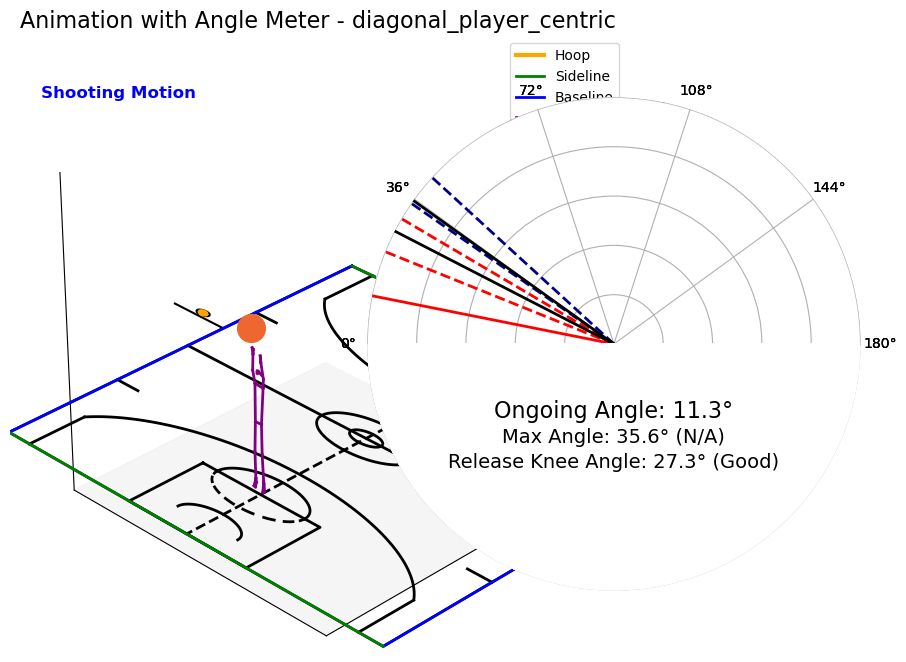

In [10]:
# %%writefile animate_shot_meter_main.py

import logging
import pandas as pd
from IPython.display import display

from animate.animate_from_df_with_shot_meters import animate_trial_with_angle_meter

joint_configs = [
    {
        'name': 'knee',
        'min_angle_key': 'knee_max_angle_filtered_optimal_min',
        'max_angle_key': 'knee_max_angle_filtered_optimal_max',
        'release_min_angle_key': 'knee_release_angle_filtered_optimal_min',
        'release_max_angle_key': 'knee_release_angle_filtered_optimal_max',
        'angle_key': 'knee_angle',
        'is_max_key': 'is_knee_max_angle',
        'classification_key': 'knee_max_angle_shot_classification',
        'release_classification_key': 'knee_release_angle_shot_classification'
    },
    {
        'name': 'elbow',
        'min_angle_key': 'elbow_max_angle_filtered_optimal_min',
        'max_angle_key': 'elbow_max_angle_filtered_optimal_max',
        'release_min_angle_key': 'elbow_release_angle_filtered_optimal_min',
        'release_max_angle_key': 'elbow_release_angle_filtered_optimal_max',
        'angle_key': 'elbow_angle',
        'is_max_key': 'is_elbow_max_angle',
        'classification_key': 'elbow_max_angle_shot_classification',
        'release_classification_key': 'elbow_release_angle_shot_classification'
    },
    {
        'name': 'wrist',
        'min_angle_key': 'wrist_max_angle_filtered_optimal_min',
        'max_angle_key': 'wrist_max_angle_filtered_optimal_max',
        'release_min_angle_key': 'wrist_release_angle_filtered_optimal_min',
        'release_max_angle_key': 'wrist_release_angle_filtered_optimal_max',
        'angle_key': 'wrist_angle',
        'is_max_key': 'is_wrist_max_angle',
        'classification_key': 'max_wrist_max_angle_shot_classification',
        'release_classification_key': 'wrist_release_angle_shot_classification'
    }
]


# Configure logging for debugging
logging.basicConfig(level=logging.DEBUG, format='%(asctime)s - %(levelname)s - %(message)s')
logger = logging.getLogger(__name__)

def main():
    try:
        # Load data from the specified CSV file
        data_path = "../../data/model/shot_meter_docs/final_granular_logistic_optimized_meter_dataset.csv"
        final_granular_df_with_stats = pd.read_csv(data_path)
        logger.debug(f"Loaded data from {data_path} with shape {final_granular_df_with_stats.shape}")

        # Define connections between joints
        connections = [
            ("R_EYE", "L_EYE"), ("R_EYE", "NOSE"), ("L_EYE", "NOSE"),
            ("R_EYE", "R_EAR"), ("L_EYE", "L_EAR"), ("R_SHOULDER", "L_SHOULDER"),
            ("R_SHOULDER", "R_ELBOW"), ("L_SHOULDER", "L_ELBOW"), ("R_ELBOW", "R_WRIST"),
            ("L_ELBOW", "L_WRIST"), ("R_SHOULDER", "R_HIP"), ("L_SHOULDER", "L_HIP"),
            ("R_HIP", "L_HIP"), ("R_HIP", "R_KNEE"), ("L_HIP", "L_KNEE"),
            ("R_KNEE", "R_ANKLE"), ("L_KNEE", "L_ANKLE"), ("R_WRIST", "R_1STFINGER"),
            ("R_WRIST", "R_5THFINGER"), ("L_WRIST", "L_1STFINGER"), ("L_WRIST", "L_5THFINGER"),
            ("R_ANKLE", "R_1STTOE"), ("R_ANKLE", "R_5THTOE"), ("L_ANKLE", "L_1STTOE"),
            ("L_ANKLE", "L_5THTOE"), ("R_ANKLE", "R_CALC"), ("L_ANKLE", "L_CALC"),
            ("R_1STTOE", "R_5THTOE"), ("L_1STTOE", "L_5THTOE"), ("R_1STTOE", "R_CALC"),
            ("L_1STTOE", "L_CALC"), ("R_5THTOE", "R_CALC"), ("L_5THTOE", "L_CALC"),
            ("R_1STFINGER", "R_5THFINGER"), ("L_1STFINGER", "L_5THFINGER")
        ]
        logger.debug("Defined joint connections for player skeleton.")

        # Select a specific trial for visualization
        trial_id_to_visualize = 'T0089'  # Replace with actual trial ID you want to visualize
        trial_data = final_granular_df_with_stats[final_granular_df_with_stats['trial_id'] == trial_id_to_visualize]
        trial_data = trial_data.sort_values(by='frame_time').reset_index(drop=True)
        logger.debug(f"Selected trial ID '{trial_id_to_visualize}' with {len(trial_data)} frames.")

        # Determine the release frame (the frame where release_point_filter is 1)
        release_frames = trial_data.index[trial_data["release_point_filter"] == 1].tolist()
        release_frame = release_frames[0] if release_frames else None
        if release_frame is not None:
            logger.debug(f"Release frame found at index {release_frame}.")
        else:
            logger.warning("No release frame found in the trial data.")

        # Set parameters for visualization
        viewpoint_name = "diagonal_player_centric"  # Choose from COMMON_VIEWPOINTS
        zlim = 15        # Adjust for height

        # Define text_offsets as a list of lists, each sublist corresponds to a joint
        text_offsets = [
            [0.3, 0.35, 0.25],  # For 'knee'
            [0.3, 0.35, 0.25],  # For 'elbow'
            [0.3, 0.35, 0.25]   # For 'wrist'
        ]

        # Call the enhanced animation function with angle meters
        angle_meter_animation_html = animate_trial_with_angle_meter(
            df=trial_data,
            release_frame=release_frame,
            viewpoint_name=viewpoint_name,  # Pass viewpoint_name instead of elev and azim
            connections=connections,
            zlim=zlim,
            joint_configs=joint_configs,  # Pass joint_configs explicitly
            player_color="purple",
            player_lw=2.0,
            ball_color="#ee6730",
            ball_size=20.0,
            highlight_color="red",
            show_court=True,
            court_type="nba",
            units="ft",
            notebook_mode=True,
            debug=True,  # Enable detailed logging for troubleshooting
            text_offsets=text_offsets  # Pass the list of text offsets
        )

        # Display the enhanced animation with angle meters
        display(angle_meter_animation_html)
    except Exception as e:
        logger.error(f"An error occurred in main: {e}")
        raise


if __name__ == "__main__":
    main()


### add on shaps/bayes optimization angles

In [15]:
import pandas as pd
import numpy as np
import json
import os
import pickle
from datetime import datetime
import logging
from typing import List, Tuple, Dict
import re
import requests
from io import BytesIO
from pathlib import Path
import ast  # used for safely evaluating strings if needed (not used now)

# Configure logging
logger = logging.getLogger('bayes_optimization_df')
if not logger.hasHandlers():
    logger.setLevel(logging.DEBUG)
    handler = logging.StreamHandler()
    formatter = logging.Formatter('%(asctime)s - %(levelname)s - %(message)s')
    handler.setFormatter(formatter)
    logger.addHandler(handler)


def load_features_from_pickle(pickle_path: str, y_variable: str = 'result') -> List[str]:
    """
    Loads features from a pickle file and excludes the y variable.
    """
    try:
        if pickle_path.startswith('http://') or pickle_path.startswith('https://'):
            response = requests.get(pickle_path)
            response.raise_for_status()
            pickle_file = BytesIO(response.content)
            features_data = pickle.load(pickle_file)
        else:
            with open(pickle_path, 'rb') as f:
                features_data = pickle.load(f)
        if isinstance(features_data, pd.DataFrame):
            features = list(features_data.columns)
        elif isinstance(features_data, list):
            features = features_data
        else:
            raise ValueError("Pickle file must contain a list or a DataFrame of features.")
        if y_variable in features:
            features.remove(y_variable)
        logger.debug(f"Loaded features from pickle: {features}")
        return features
    except Exception as e:
        logger.error(f"Error loading features from pickle: {e}")
        raise


def load_precalculated_bayesian_metrics(
    bayesian_metrics_file_path: str,
    debug: bool = False
) -> pd.DataFrame:
    """
    Load the precalculated bayesian metrics table.
    Expected columns: Parameter, Optimized (Candidate, Real), Baseline (Real),
                      Min (Real), Max (Real), Success Rate (Baseline), Success Rate (Candidate).
    The columns are then renamed.
    """
    try:
        if debug:
            logger.debug(f"Loading precalculated bayesian metrics from {bayesian_metrics_file_path}...")
        df = pd.read_csv(bayesian_metrics_file_path)
        required_columns = [
            "Parameter",
            "Optimized (Candidate, Real)",
            "Baseline (Real)",
            "Min (Real)",
            "Max (Real)",
            "Success Rate (Baseline)",
            "Success Rate (Candidate)"
        ]
        df = df[required_columns]
        df.rename(
            columns={
                "Optimized (Candidate, Real)": "bayes_optimized",  # Optimized by the bayesian process
                "Baseline (Real)": "baseline",                    # The original or observed (real) value
                "Min (Real)": "bayes_min",                        # Lower bound from bayesian optimization
                "Max (Real)": "bayes_max",                        # Upper bound from bayesian optimization
                "Success Rate (Baseline)": "baseline_success_rate",
                "Success Rate (Candidate)": "bayes_success_rate"
            },
            inplace=True
        )

        if debug:
            logger.debug("Precalculated bayesian metrics loaded:")
            logger.debug(df.head())
        return df
    except Exception as e:
        logger.error(f"Error loading precalculated bayesian metrics: {e}")
        raise


def add_bayesian_ranges_to_ml_dataset(
    bayesian_metrics_data: pd.DataFrame,
    final_ml_data_path: str,
    output_dir: str = "../../data/model/shot_meter_docs/",
    debug: bool = False
) -> pd.DataFrame:
    """
    Adds precalculated bayesian metrics to the final ML dataset.
    For each parameter, adds three columns:
      - <parameter>_optimized_metric
      - <parameter>_min_real
      - <parameter>_max_real
    """
    step_name = "Add Precalculated Bayesian Metrics to ML Dataset"
    try:
        # Build dictionaries for the required values from the bayesian metrics table
        opt_dict = pd.Series(bayesian_metrics_data['bayes_optimized'].values,
                             index=bayesian_metrics_data['Parameter'].str.lower()).to_dict()
        min_dict = pd.Series(bayesian_metrics_data['bayes_min'].values,
                             index=bayesian_metrics_data['Parameter'].str.lower()).to_dict()
        max_dict = pd.Series(bayesian_metrics_data['bayes_max'].values,
                             index=bayesian_metrics_data['Parameter'].str.lower()).to_dict()
        if debug:
            logger.debug(f"Loading final ML dataset from {final_ml_data_path}...")
        final_ml_data = pd.read_csv(final_ml_data_path)
        # Add optimized metric, min, and max columns to final ML dataset
        for param, value in opt_dict.items():
            col_name = f"{param}_bayes_optimized"
            final_ml_data[col_name] = value
            if debug:
                logger.debug(f"Added column '{col_name}' with value {value}")
        for param, value in min_dict.items():
            col_name = f"{param}_bayes_min"
            final_ml_data[col_name] = value
            if debug:
                logger.debug(f"Added column '{col_name}' with value {value}")
        for param, value in max_dict.items():
            col_name = f"{param}_bayes_max"
            final_ml_data[col_name] = value
            if debug:
                logger.debug(f"Added column '{col_name}' with value {value}")
        output_filename = "ml_dataset_with_bayesian_metrics.csv"
        output_path = os.path.join(output_dir, output_filename)
        final_ml_data.to_csv(output_path, index=False)
        if debug:
            logger.debug(f"Updated ML dataset saved to {output_path}")
        return final_ml_data
    except Exception as e:
        logger.error(f"Error in {step_name}: {e}")
        raise


def classify_metrics(
    final_ml_data: pd.DataFrame,
    bayesian_metrics: List[str],
    output_dir: str = "../../data/model/shot_meter_docs/",
    debug: bool = False
) -> pd.DataFrame:
    """
    For each metric, based on the bayesian range columns (if they exist), classify the baseline
    value as 'Early', 'Late', or 'Good'.
    """
    step_name = "Classify Metrics"
    try:
        for metric in bayesian_metrics:
            base_metric_col = metric
            bayes_min_col = f"{metric}_bayes_min"  # may not exist; skip if missing
            bayes_max_col = f"{metric}_bayes_max"
            classification_col = f"{metric}_bayes_classification"
            if bayes_min_col not in final_ml_data.columns or bayes_max_col not in final_ml_data.columns:
                if debug:
                    logger.warning(f"Bayesian range columns for '{metric}' not found. Skipping classification for this metric.")
                continue
            final_ml_data[classification_col] = np.select(
                [
                    final_ml_data[base_metric_col] < final_ml_data[bayes_min_col],
                    final_ml_data[base_metric_col] > final_ml_data[bayes_max_col]
                ],
                ['Early', 'Late'],
                default='Good'
            )
        if debug:
            logger.debug(f"Step: {step_name} - Classification completed for all metrics.")
        output_filename = "classified_ml_dataset.csv"
        output_path = os.path.join(output_dir, output_filename)
        final_ml_data.to_csv(output_path, index=False)
        if debug:
            logger.debug(f"Step: {step_name} - Classified dataset saved to {output_path}")
        return final_ml_data
    except Exception as e:
        logger.error(f"Error in {step_name}: {e}")
        raise


def merge_bayes_metrics_with_granular_data(
    final_granular_dataset: pd.DataFrame,
    final_ml_bayes_optimized_meter_dataset: pd.DataFrame,
    bayesian_metrics: List[str],
    output_dir: str = "../../data/model/shot_meter_docs/",
    debug: bool = False
) -> pd.DataFrame:
    """
    Merges the ML dataset (which now has the bayesian metrics appended) with the granular dataset.
    """
    step_name = "Merge Bayesian Metrics with Granular Dataset"
    try:
        if debug:
            logger.debug(f"Step: {step_name} - Checking trial_id alignment...")
            unique_granular = final_granular_dataset['trial_id'].nunique()
            unique_ml = final_ml_bayes_optimized_meter_dataset['trial_id'].nunique()
            logger.debug(f"Unique trial_ids in granular dataset: {unique_granular}")
            logger.debug(f"Unique trial_ids in Bayesian metrics dataset: {unique_ml}")
        if debug:
            logger.debug(f"Step: {step_name} - Performing left join on 'trial_id'...")
        merged_dataset = final_granular_dataset.merge(
            final_ml_bayes_optimized_meter_dataset,
            on='trial_id',
            how='left',
            suffixes=('', '_meter')
        )
        output_filename = "bayesian_shot_meter_granular_dataset_with_predictions_and_shap.csv"
        output_path = os.path.join(output_dir, output_filename)
        merged_dataset.to_csv(output_path, index=False)
        if debug:
            logger.debug(f"Step: {step_name} - Merged dataset shape: {merged_dataset.shape}")
            logger.debug(f"Step: {step_name} - Merged dataset saved to {output_path}")
        return merged_dataset
    except Exception as e:
        logger.error(f"Error in {step_name}: {e}")
        raise


def bayesian_optimized_granular_data_main(
    bayesian_metrics_file_path: str = "../../data/predictions/bayesian_optimization_results/bayesian_optimization_results.csv",
    final_ml_file_path: str = "../../data/processed/final_ml_dataset.csv",
    final_ml_with_predictions_path: str = "../../data/model/predictions/final_dataset_with_predictions_and_shap.csv",
    final_granular_file_path: str = "../../data/processed/final_granular_dataset.csv",
    pickle_path: str = "../../data/preprocessor/features_info/final_ml_df_selected_features_columns.pkl",
    y_variable: str = "result",
    output_dir: str = "../../data/model/shot_meter_docs/",
    debug: bool = False,
    bayes_min_max_range: float = 10
) -> Tuple[pd.DataFrame, Dict[str, Dict[str, float]]]:
    """
    Main function to execute bayesian optimization data processing using precalculated bayesian metrics.
    
    Returns:
      Tuple[pd.DataFrame, Dict[str, Dict[str, float]]]: (merged_data, bayesian_metrics_dict)
    """
    step_name = "Bayesian Optimization Data Processing (Precalculated)"
    try:
        if debug:
            logger.debug(f"Starting main function: {step_name}")
    
        # Step 0: Load feature names
        if debug:
            logger.debug(f"Step 0: Loading feature names from pickle at '{pickle_path}'...")
        bayesian_metrics = load_features_from_pickle(pickle_path=pickle_path, y_variable=y_variable)
        if debug:
            logger.debug(f"Loaded bayesian metrics: {bayesian_metrics}")
    
        # Step 1: Load the precalculated bayesian metrics table (including min and max)
        combined_data = load_precalculated_bayesian_metrics(
            bayesian_metrics_file_path=bayesian_metrics_file_path,
            debug=debug
        )
    
        # Step 2: Add the precalculated metrics (optimized, min, max) to the final ML dataset.
        final_ml_bayes_optimized_meter_dataset = add_bayesian_ranges_to_ml_dataset(
            bayesian_metrics_data=combined_data,
            final_ml_data_path=final_ml_with_predictions_path,
            output_dir=output_dir,
            debug=debug
        )
    
        # Step 3: Optionally, classify metrics (if classification columns exist)
        final_ml_bayes_optimized_meter_dataset = classify_metrics(
            final_ml_data=final_ml_bayes_optimized_meter_dataset,
            bayesian_metrics=bayesian_metrics,
            output_dir=output_dir,
            debug=debug
        )
    
        #debug:
        final_ml_data = pd.read_csv(final_ml_with_predictions_path)
        if debug:
            logger.debug("Final ML dataset columns after loading SHAP data:")
            logger.debug(final_ml_data.columns.to_list())

        # Step 4: Merge the ML dataset with the granular dataset
        merged_data = merge_bayes_metrics_with_granular_data(
            final_granular_dataset=pd.read_csv(final_granular_file_path),
            final_ml_bayes_optimized_meter_dataset=final_ml_bayes_optimized_meter_dataset,
            bayesian_metrics=bayesian_metrics,
            output_dir=output_dir,
            debug=debug
        )
    
        # Step 5: Build the bayesian_metrics_dict for downstream use, with updated key names.
        # Here we remove any inclusion of specific feedback because that information is already part of the predictions dataset.
        bayesian_metrics_dict = {}
        for metric in bayesian_metrics:
            optimized_metric_col = f"{metric}_bayes_optimized"
            bayes_classification_col = f"{metric}_bayes_classification"
            shap_importance_col = f"shap_{metric}_importance"
            min_col = f"{metric}_bayes_min"
            max_col = f"{metric}_bayes_max"
            if optimized_metric_col in merged_data.columns:
                bayesian_metrics_dict[metric] = {
                    'bayes_optimal': merged_data.at[0, optimized_metric_col],
                    'bayes_original': merged_data.at[0, metric],
                    'bayes_min': merged_data.at[0, min_col] if min_col in merged_data.columns else None,
                    'bayes_max': merged_data.at[0, max_col] if max_col in merged_data.columns else None,
                    'bayes_classification': (merged_data.at[0, bayes_classification_col]
                                             if bayes_classification_col in merged_data.columns
                                             else "Good"),
                    'shap_importance': (merged_data.at[0, shap_importance_col]
                                        if shap_importance_col in merged_data.columns
                                        else None)
                    # Note: specific feedback is not added to the dictionary.
                }
            else:
                if debug:
                    logger.warning(f"Optimized metric column for '{metric}' not found. Skipping.")
    
        # Add a filter_name for each metric (e.g. by removing "release_" or "_max")
        no_change_list = ["calculated_release_angle", "release_angle"]
        for metric, values in bayesian_metrics_dict.items():
            if metric in no_change_list:
                filter_name = metric
            else:
                filter_name = metric.replace("release_", "").replace("_max", "")
            bayesian_metrics_dict[metric]['filter_name'] = filter_name
    
        # Optionally add SHAP direction if exists
        for metric in bayesian_metrics:
            shap_direction_col = f"shap_{metric}_direction"
            if shap_direction_col in merged_data.columns:
                bayesian_metrics_dict[metric]['shap_direction'] = merged_data.at[0, shap_direction_col]
                if debug:
                    logger.debug(f"Extracted '{shap_direction_col}': shap_direction={merged_data.at[0, shap_direction_col]}")
            else:
                if debug:
                    logger.warning(f"Missing shap_direction column '{shap_direction_col}' for metric '{metric}'. Setting shap_direction to None.")
                bayesian_metrics_dict[metric]['shap_direction'] = None
    
        if debug:
            logger.debug("Bayesian Metrics Dictionary (Precalculated):")
            logger.debug(json.dumps(bayesian_metrics_dict, indent=4))
    
        bayesian_metrics_output_path = os.path.join(output_dir, "bayesian_metrics_dict.json")
        with open(bayesian_metrics_output_path, 'w') as f:
            json.dump(bayesian_metrics_dict, f, indent=4)
        if debug:
            logger.debug(f"Bayesian metrics dictionary saved to {bayesian_metrics_output_path}")
    
        return merged_data, bayesian_metrics_dict
    except Exception as e:
        logger.error(f"Error in {step_name}: {e}")
        raise



if __name__ == "__main__":
    config_path = Path('../../data/model/preprocessor_config/preprocessor_config.yaml')
    try:
        from ml.config.config_loader import load_config
        from ml.config.config_models import AppConfig
        config: AppConfig = load_config(config_path)
        print(f"Config loaded from {config_path}")
    except Exception as e:
        print("Failed to load config:", e)
        exit(1)
    
    data_dir = Path(config.paths.data_dir).resolve()
    df_path = data_dir / config.paths.raw_data
    df = pd.read_csv(df_path)
    try:
        merged_data, bayesian_metrics_dict = bayesian_optimized_granular_data_main(
            bayesian_metrics_file_path="../../data/predictions/bayesian_optimization_results/bayesian_optimization_results.csv",
            final_ml_file_path="../../data/processed/final_ml_dataset.csv",
            final_ml_with_predictions_path="../../data/predictions/shap_results/final_predictions_with_shap.csv", # changed from "../../data/model/predictions/final_dataset_with_predictions_and_shap.csv",
            final_granular_file_path="../../data/model/shot_meter_docs/final_granular_logistic_optimized_meter_dataset.csv",   # changed from "../../data/processed/final_granular_dataset.csv",
            pickle_path="../../data/preprocessor/features_info/final_ml_df_selected_features_columns.pkl",
            y_variable="result",
            output_dir="../../data/model/shot_meter_docs/",
            debug=True,
            bayes_min_max_range=20
        )
        logger.debug("Merged ML dataset columns:")
        logger.debug(merged_data.columns.to_list())
    except Exception as main_e:
        logger.error(f"An error occurred during main execution: {main_e}")



2025-01-30 14:41:33,206 - DEBUG - Starting main function: Bayesian Optimization Data Processing (Precalculated)
2025-01-30 14:41:33,207 - DEBUG - Step 0: Loading feature names from pickle at '../../data/preprocessor/features_info/final_ml_df_selected_features_columns.pkl'...
2025-01-30 14:41:33,207 - DEBUG - Loaded features from pickle: ['release_ball_direction_x', 'release_ball_direction_z', 'release_ball_direction_y', 'elbow_release_angle', 'elbow_max_angle', 'wrist_release_angle', 'wrist_max_angle', 'knee_release_angle', 'knee_max_angle', 'release_ball_speed', 'calculated_release_angle', 'release_ball_velocity_x', 'release_ball_velocity_y', 'release_ball_velocity_z']
2025-01-30 14:41:33,208 - DEBUG - Loaded bayesian metrics: ['release_ball_direction_x', 'release_ball_direction_z', 'release_ball_direction_y', 'elbow_release_angle', 'elbow_max_angle', 'wrist_release_angle', 'wrist_max_angle', 'knee_release_angle', 'knee_max_angle', 'release_ball_speed', 'calculated_release_angle', 're

[Config Loader] ✅ Successfully loaded configuration from ..\..\data\model\preprocessor_config\preprocessor_config.yaml
Config loaded from ..\..\data\model\preprocessor_config\preprocessor_config.yaml


2025-01-30 14:41:33,705 - DEBUG - Step: Merge Bayesian Metrics with Granular Dataset - Merged dataset shape: (1871, 439)
2025-01-30 14:41:33,705 - DEBUG - Step: Merge Bayesian Metrics with Granular Dataset - Merged dataset saved to ../../data/model/shot_meter_docs/bayesian_shot_meter_granular_dataset_with_predictions_and_shap.csv
2025-01-30 14:41:33,707 - DEBUG - Extracted 'shap_release_ball_direction_x_direction': shap_direction=decrease
2025-01-30 14:41:33,708 - DEBUG - Extracted 'shap_release_ball_direction_z_direction': shap_direction=decrease
2025-01-30 14:41:33,709 - DEBUG - Extracted 'shap_release_ball_direction_y_direction': shap_direction=decrease
2025-01-30 14:41:33,709 - DEBUG - Extracted 'shap_elbow_release_angle_direction': shap_direction=decrease
2025-01-30 14:41:33,709 - DEBUG - Extracted 'shap_elbow_max_angle_direction': shap_direction=decrease
2025-01-30 14:41:33,710 - DEBUG - Extracted 'shap_wrist_release_angle_direction': shap_direction=decrease
2025-01-30 14:41:33,7

In [16]:
# bayes_angle_meter.py

import logging
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d.art3d import Poly3DCollection
from datetime import datetime
import re
import json

# Configure logging only once
logger = logging.getLogger('bayes_angle_meter')
if not logger.hasHandlers():
    logger.setLevel(logging.DEBUG)
    handler = logging.StreamHandler()
    formatter = logging.Formatter('%(asctime)s - %(levelname)s - %(message)s')
    handler.setFormatter(formatter)
    logger.addHandler(handler)

def get_timestamp() -> str:
    """Returns the current timestamp formatted as YYYYMMDD_HHMMSS."""
    return datetime.now().strftime("%Y%m%d_%H%M%S")


def update_bayes_angle_meter(
    ax_meter: plt.Axes,
    df: pd.DataFrame,
    frame: int,
    needle: plt.Line2D,
    angle_text: plt.Text,
    bayes_classification_text: plt.Text,
    shap_importance_text: plt.Text,
    shap_direction_text: plt.Text,
    bayesian_metrics_dict: dict,
    selected_metric: str,
    debug: bool = False
) -> None:
    """
    Update the angle meter based on the selected metric and current frame data.
    """
    try:
        metric_key = selected_metric.lower()
        metric_info = bayesian_metrics_dict.get(metric_key, {})
        if not metric_info:
            logger.error(f"Metric '{selected_metric}' not found in bayesian_metrics_dict.")
            raise ValueError(f"Metric '{selected_metric}' not found in bayesian_metrics_dict.")

        # Ongoing metric value
        ongoing_value = df.at[frame, metric_info['filter_name']]
        ongoing_angle_rad = ongoing_value * np.pi / 180  # Convert to radians

        # Update needle position
        needle.set_data([0, ongoing_angle_rad], [0, 1])

        # Update angle text
        angle_text.set_text(f'Ongoing {metric_info["filter_name"].replace("_", " ").capitalize()}: {ongoing_value:.1f}°')

        # Update Bayesian Classification
        classification = metric_info['bayes_classification']
        bayes_classification_text.set_text(f'Bayesian Classification: {classification}')

        # Update SHAP Importance
        shap_importance = metric_info['shap_importance']
        shap_importance_text.set_text(f'SHAP Importance: {shap_importance:.4f}')

        # Update SHAP Direction with arrows/icons
        shap_direction = metric_info['shap_direction']
        if shap_direction.lower() == 'positive':
            shap_direction_text.set_text('Direction: ▲ Increase this metric')
            shap_direction_text.set_color('green')
        elif shap_direction.lower() == 'negative':
            shap_direction_text.set_text('Direction: ▼ Decrease this metric')
            shap_direction_text.set_color('red')
        else:
            shap_direction_text.set_text('Direction: N/A')
            shap_direction_text.set_color('black')

        if debug:
            logger.debug(
                f"Frame {frame}: {metric_info['filter_name']} = {ongoing_value:.1f}°, "
                f"Classification: '{classification}', SHAP Importance: {shap_importance:.4f}, "
                f"SHAP Direction: '{shap_direction}'."
            )

    except KeyError as e:
        logger.error(f"Missing column during angle meter update: {e}")
        raise
    except Exception as e:
        logger.error(f"Error in update_bayes_angle_meter: {e}")
        raise

def add_bayes_optimal_lines(
    ax: plt.Axes,
    min_angle: float,
    max_angle: float,
    debug: bool = False
) -> None:
    """
    Add optimal min and max lines to the angle meter, including release min and max angles.
    """
    try:
        # Convert angles to radians
        min_angle_rad = min_angle * np.pi / 180
        max_angle_rad = max_angle * np.pi / 180

        # Plotting optimal min and max lines with distinct colors and labels
        ax.plot([0, min_angle_rad], [0, 1], color='blue', lw=2, linestyle="--", label='Bayes Min')
        ax.plot([0, max_angle_rad], [0, 1], color='green', lw=2, linestyle="--", label='Bayes Max')

        if debug:
            logger.debug(
                f"Added optimal lines at {min_angle}°, {max_angle}° with labels 'Bayes Min' and 'Bayes Max'."
            )
    except Exception as e:
        logger.error(f"Error in add_bayes_optimal_lines: {e}")
        raise

def create_bayes_angle_meter(
    fig: plt.Figure,
    selected_metric: str,
    bayesian_metrics_dict: dict,
    text_offsets: dict,
    debug: bool = False
) -> tuple:
    """
    Create an angle meter plot for the selected metric using bayesian_metrics_dict.
    """
    try:
        # Validate selected_metric
        metric_key = selected_metric.lower()
        if metric_key not in bayesian_metrics_dict:
            logger.error(f"Metric '{selected_metric}' not found in bayesian_metrics_dict.")
            raise ValueError(f"Metric '{selected_metric}' not found in bayesian_metrics_dict.")

        metric_info = bayesian_metrics_dict[metric_key]
        bayes_min = metric_info['bayes_min']
        bayes_max = metric_info['bayes_max']
        bayes_classification = metric_info['bayes_classification']
        shap_importance = metric_info['shap_importance']
        shap_direction = metric_info['shap_direction']

        # Set up angle meter as a polar subplot for half-circle (180 degrees)
        ax_meter = fig.add_subplot(122, polar=True)
        ax_meter.set_theta_offset(np.pi)  # Rotate to make it horizontal
        ax_meter.set_theta_direction(-1)  # Counter-clockwise

        # Define 180-degree range with ticks and labels
        angle_ticks = np.linspace(0, np.pi, 6)
        angle_labels = [f'{int(angle)}°' for angle in np.linspace(0, 180, 6)]
        ax_meter.set_xticks(angle_ticks)
        ax_meter.set_xticklabels(angle_labels)
        ax_meter.set_yticklabels([])  # Hide radial labels for clarity

        # Limit the radial display to the upper half
        ax_meter.set_ylim(0, 1)  # Only show radial values from 0 to 1

        # Hide the lower half of the plot by masking the unwanted area
        ax_meter.set_facecolor("white")  # Set facecolor to blend with background
        ax_meter.fill_between(np.linspace(np.pi, 2 * np.pi, 100), 0, 1, color="white", zorder=10)  # Cover bottom half

        # Remove the full circular outline and add a 180-degree dividing line
        ax_meter.spines['polar'].set_visible(False)  # Hide full circular outline
        ax_meter.plot([0, np.pi], [0, 1], color='black', lw=1)  # Add a line along 180 degrees

        # Add Bayesian Min and Max lines with distinct colors and styles
        bayes_min_rad = bayes_min * np.pi / 180
        bayes_max_rad = bayes_max * np.pi / 180
        ax_meter.plot([0, bayes_min_rad], [0, 1], color='blue', lw=2, linestyle="--", label='Bayes Min')
        ax_meter.plot([0, bayes_max_rad], [0, 1], color='green', lw=2, linestyle="--", label='Bayes Max')

        # Initialize the needle and text placeholders with adjustable y-positions
        needle, = ax_meter.plot([], [], color='red', lw=3, label='Current Angle')  # Thicker and distinct color
        angle_text = ax_meter.text(
            0.5, text_offsets['angle_text_y'], '', transform=ax_meter.transAxes,
            ha='center', fontsize=14, weight='bold', zorder=15
        )
        bayes_classification_text = ax_meter.text(
            0.5, text_offsets['bayes_classification_text_y'], '', transform=ax_meter.transAxes,
            ha='center', fontsize=12, color='orange', zorder=15
        )
        shap_importance_text = ax_meter.text(
            0.5, text_offsets['shap_importance_text_y'], '', transform=ax_meter.transAxes,
            ha='center', fontsize=12, color='purple', zorder=15
        )
        shap_direction_text = ax_meter.text(
            0.5, text_offsets['shap_direction_text_y'], '', transform=ax_meter.transAxes,
            ha='center', fontsize=12, zorder=15
        )

        # Add legend to explain the lines
        ax_meter.legend(loc='upper right', bbox_to_anchor=(1.1, 1.1))

        if debug:
            logger.debug(f"Angle meter for '{selected_metric}' initialized with needle and angle text placeholders.")

        return ax_meter, needle, angle_text, bayes_classification_text, shap_importance_text, shap_direction_text
    except Exception as e:
        logger.error(f"Error: {e}")
        raise

def initialize_bayes_angle_meter(
    fig: plt.Figure,
    df: pd.DataFrame,
    metric: str,
    bayesian_metrics_dict: dict,
    text_offsets: dict,
    debug: bool = False
) -> dict:
    """
    Initialize the angle meter for the selected metric using bayesian_metrics_dict.
    """
    angle_meter_obj = {}
    try:
        if metric.lower() not in bayesian_metrics_dict:
            logger.error(f"Metric '{metric}' not found in bayesian_metrics_dict.")
            raise ValueError(f"Metric '{metric}' not found in bayesian_metrics_dict.")

        # Create angle meter
        ax_meter, needle, angle_text, bayes_classification_text, shap_importance_text, shap_direction_text = create_bayes_angle_meter(
            fig=fig,
            selected_metric=metric,
            bayesian_metrics_dict=bayesian_metrics_dict,
            text_offsets=text_offsets,
            debug=debug
        )

        angle_meter_obj = {
            'ax_meter': ax_meter,
            'needle': needle,
            'angle_text': angle_text,
            'bayes_classification_text': bayes_classification_text,
            'shap_importance_text': shap_importance_text,
            'shap_direction_text': shap_direction_text,
            'metric': metric  # Store metric name for reference
        }

        if debug:
            logger.debug(f"Initialized angle meter for metric '{metric}'.")

    except Exception as e:
        logger.error(f"Error initializing angle meter for metric '{metric}': {e}")
        raise
    return angle_meter_obj


2025-01-30 14:41:39,640 - DEBUG - Loaded Bayesian metrics dictionary from ../../data/model/shot_meter_docs/bayesian_metrics_dict.json
2025-01-30 14:41:39,641 - DEBUG - {
    "release_ball_direction_x": {
        "bayes_optimal": 0.5083172720043937,
        "bayes_original": 0.3770123170199189,
        "bayes_min": 0.0086992707706908,
        "bayes_max": 0.5083172720043937,
        "bayes_classification": "Good",
        "shap_importance": 0.0728,
        "filter_name": "ball_direction_x",
        "shap_direction": "decrease"
    },
    "release_ball_direction_z": {
        "bayes_optimal": 0.859473648316606,
        "bayes_original": 0.926203487482012,
        "bayes_min": 0.859473648316606,
        "bayes_max": 0.9953476001943634,
        "bayes_classification": "Good",
        "shap_importance": 0.0551,
        "filter_name": "ball_direction_z",
        "shap_direction": "decrease"
    },
    "release_ball_direction_y": {
        "bayes_optimal": 0.0535667227262484,
        "bayes_o

2025-01-30 14:41:43,194 - DEBUG - Updating frame 0
2025-01-30 14:41:43,196 - DEBUG - Frame 0: wrist_angle = 25.7°, Classification: 'Good', SHAP Importance: 0.3174, SHAP Direction: 'increase'.


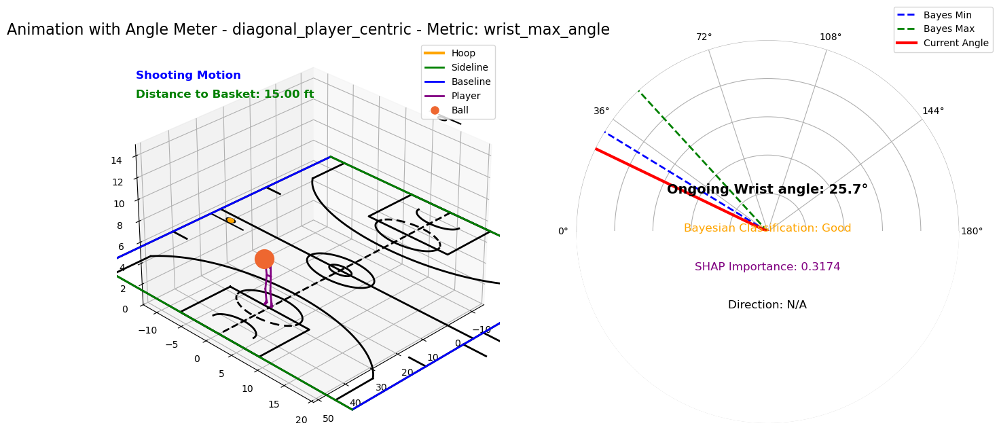

In [17]:
# bayes_animate_from_df_with_bayes_shot_meters.py

import logging
import pandas as pd
import json
from IPython.display import HTML, display
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from matplotlib.lines import Line2D
from mpl_toolkits.mplot3d.art3d import Poly3DCollection
from mplbasketball.court3d import Court3D, draw_court_3d
import matplotlib as mpl

# Increase the animation embed limit to 30 MB
mpl.rcParams['animation.embed_limit'] = 30.0  # Value is in MB

# from bayes_angle_meter import (
#     update_bayes_angle_meter,
#     initialize_bayes_angle_meter
# )
from animate.court import draw_court, get_hoop_position
from animate.viewpoints import get_viewpoint

# Configure logging
logger = logging.getLogger('bayes_animate')
if not logger.hasHandlers():
    logger.setLevel(logging.DEBUG)  # Set to DEBUG to capture all logs
    handler = logging.StreamHandler()
    formatter = logging.Formatter('%(asctime)s - %(levelname)s - %(message)s')
    handler.setFormatter(formatter)
    logger.addHandler(handler)

def initialize_bayes_elements(
    ax: plt.Axes,
    connections: list,
    player_color: str,
    player_lw: float,
    ball_color: str,
    ball_size: float,
    debug: bool = False
) -> (dict, plt.Line2D, plt.Text, plt.Text, plt.Text):
    """
    Initialize plot elements such as lines for the player skeleton and the ball.
    """
    try:
        # Initialize lines for each body connection
        lines = {connection: ax.plot([], [], [], c=player_color, lw=player_lw)[0] for connection in connections}
        
        # Initialize the ball as a point
        ball, = ax.plot([], [], [], "o", markersize=ball_size, c=ball_color)
        
        # Text elements for annotations
        release_text = ax.text2D(0.05, 0.95, "", transform=ax.transAxes, color="red", fontsize=14, weight="bold")
        motion_text = ax.text2D(0.05, 0.90, "", transform=ax.transAxes, color="blue", fontsize=12, weight="bold")
        
        # New text element for distance (positioned below motion_text)
        distance_text = ax.text2D(0.05, 0.85, "", transform=ax.transAxes, color="green", fontsize=12, weight="bold")
        
        if debug:
            logger.debug("Elements initialized (lines, ball, text labels).")
        
        return lines, ball, release_text, motion_text, distance_text
    except Exception as e:
        logger.error(f"Error initializing elements: {e}")
        raise

def update_bayes_frame(
    ax: plt.Axes,
    frame: int,
    df: pd.DataFrame,
    release_frame: int,
    lines: dict,
    ball: plt.Line2D,
    release_text: plt.Text,
    motion_text: plt.Text,
    connections: list,
    ball_color: str,
    highlight_color: str,
    debug: bool = False
) -> None:
    """
    Update function for each frame in the animation.
    """
    try:
        if debug and frame % 10 == 0:
            logger.debug(f"Updating frame {frame}")

        # Highlight the release frame
        if release_frame is not None and frame == release_frame:
            ball.set_color(highlight_color)
            release_text.set_text("Release Point!")
            if debug:
                logger.debug(f"Frame {frame} is the release frame. Ball color changed to {highlight_color}.")
        else:
            ball.set_color(ball_color)
            release_text.set_text("")

        # Update motion phase text if 'shooting_motion' exists
        if 'shooting_motion' in df.columns:
            shooting_motion = df.at[frame, 'shooting_motion']
            motion_text.set_text("Shooting Motion" if shooting_motion == 1 else "")
        else:
            motion_text.set_text("")

        # Update lines for joints
        for connection in connections:
            part1, part2 = connection
            if (f"{part1}_x" in df.columns and f"{part2}_x" in df.columns and
                not pd.isna(df.at[frame, f"{part1}_x"]) and not pd.isna(df.at[frame, f"{part2}_x"])):
                x = [df.at[frame, f"{part1}_x"], df.at[frame, f"{part2}_x"]]
                y = [df.at[frame, f"{part1}_y"], df.at[frame, f"{part2}_y"]]
                z = [df.at[frame, f"{part1}_z"], df.at[frame, f"{part2}_z"]]
                lines[connection].set_data_3d(x, y, z)
            else:
                # If data is missing, hide the line
                lines[connection].set_data([], [])
                lines[connection].set_3d_properties([])

        # Update ball position if ball coordinates exist
        if 'ball_x' in df.columns and 'ball_y' in df.columns and 'ball_z' in df.columns:
            ball_x = df.at[frame, 'ball_x']
            ball_y = df.at[frame, 'ball_y']
            ball_z = df.at[frame, 'ball_z']
            if not (pd.isna(ball_x) or pd.isna(ball_y) or pd.isna(ball_z)):
                ball.set_data_3d([ball_x], [ball_y], [ball_z])
            else:
                # Hide the ball if data is missing
                ball.set_data([], [])
                ball.set_3d_properties([])
        else:
            # Hide the ball if columns are missing
            ball.set_data([], [])
            ball.set_3d_properties([])
    except Exception as e:
        logger.error(f"Error updating frame {frame}: {e}")
        raise

def animate_trial_with_bayes_angle_meter(
    df: pd.DataFrame,
    release_frame: int,
    selected_metric: str,
    bayesian_metrics_dict: dict,
    viewpoint_name: str = "side_view_right",
    connections: list = None,
    zlim: float = 15.0,
    player_color: str = "purple",
    player_lw: float = 2.0,
    ball_color: str = "#ee6730",
    ball_size: float = 20.0,
    highlight_color: str = "red",
    show_court: bool = True,
    court_type: str = "nba",
    units: str = "ft",
    notebook_mode: bool = True,
    debug: bool = False,
    frames_to_animate: list = None  # New parameter
) -> HTML:
    """
    Animate a basketball trial with an integrated angle meter using bayesian_metrics_dict.
    """
    try:
        if connections is None:
            logger.error("No connections provided for player skeleton.")
            raise ValueError("Connections list cannot be None.")

        # Define default connections if not provided
        if connections is None:
            connections = [
                ("R_EYE", "L_EYE"), ("R_EYE", "NOSE"), ("L_EYE", "NOSE"),
                ("R_EYE", "R_EAR"), ("L_EYE", "L_EAR"), ("R_SHOULDER", "L_SHOULDER"),
                ("R_SHOULDER", "R_ELBOW"), ("L_SHOULDER", "L_ELBOW"), ("R_ELBOW", "R_WRIST"),
                ("L_ELBOW", "L_WRIST"), ("R_SHOULDER", "R_HIP"), ("L_SHOULDER", "L_HIP"),
                ("R_HIP", "L_HIP"), ("R_HIP", "R_KNEE"), ("L_HIP", "L_KNEE"),
                ("R_KNEE", "R_ANKLE"), ("L_KNEE", "L_ANKLE"), ("R_WRIST", "R_1STFINGER"),
                ("R_WRIST", "R_5THFINGER"), ("L_WRIST", "L_1STFINGER"), ("L_WRIST", "L_5THFINGER"),
                ("R_ANKLE", "R_1STTOE"), ("R_ANKLE", "R_5THTOE"), ("L_ANKLE", "L_1STTOE"),
                ("L_ANKLE", "L_5THTOE"), ("R_ANKLE", "R_CALC"), ("L_ANKLE", "L_CALC"),
                ("R_1STTOE", "R_5THTOE"), ("L_1STTOE", "L_5THTOE"), ("R_1STTOE", "R_CALC"),
                ("L_1STTOE", "L_CALC"), ("R_5THTOE", "R_CALC"), ("L_5THTOE", "L_CALC"),
                ("R_1STFINGER", "R_5THFINGER"), ("L_1STFINGER", "L_5THFINGER")
            ]
            if debug:
                logger.debug("Default connections defined for player skeleton.")

        if debug:
            logger.debug("Starting animation setup.")
            logger.debug(f"Total frames in DataFrame: {len(df)}")
            logger.debug(f"Release frame index provided: {release_frame}")
            logger.debug(f"Selected viewpoint: {viewpoint_name}")
            logger.debug(f"Selected metric for angle meter: {selected_metric}")

        # Retrieve elev and azim based on viewpoint_name
        try:
            viewpoint = get_viewpoint(viewpoint_name)
            elev = viewpoint['elev']
            azim = viewpoint['azim']
            if debug:
                logger.debug(f"Retrieved viewpoint '{viewpoint_name}': elev={elev}, azim={azim}")
        except KeyError:
            logger.error(f"Invalid viewpoint_name: {viewpoint_name}. Using default viewpoint.")
            viewpoint = get_viewpoint("side_view_right")  # Fallback to default
            elev = viewpoint['elev']
            azim = viewpoint['azim']
            if debug:
                logger.debug(f"Using default viewpoint '{viewpoint['name']}': elev={elev}, azim={azim}")

        # Plot setup with predefined viewpoint
        fig = plt.figure(figsize=(16, 8))  # Increased width to accommodate angle meter
        ax_3d = fig.add_subplot(121, projection='3d')  # 3D plot on the left
        ax_3d.view_init(elev=elev, azim=azim)
        ax_3d.set_zlim(0, zlim)

        # Draw court and get hoop position
        if show_court:
            draw_court(ax_3d, court_type=court_type, units=units, debug=debug)
            hoop_x, hoop_y, hoop_z = get_hoop_position(court_type=court_type, units=units, debug=debug)
            if debug:
                logger.debug(f"Hoop position retrieved: ({hoop_x}, {hoop_y}, {hoop_z})")
        else:
            hoop_x, hoop_y, hoop_z = None, None, None
            if debug:
                logger.debug("Court not shown. Hoop position set to None.")

        # Initialize elements for animation
        lines, ball, release_text, motion_text, distance_text = initialize_bayes_elements(
            ax=ax_3d,
            connections=connections,
            player_color=player_color,
            player_lw=player_lw,
            ball_color=ball_color,
            ball_size=ball_size,
            debug=debug
        )

        # Initialize angle meter using bayesian_metrics_dict
        metric_info = bayesian_metrics_dict.get(selected_metric.lower())
        if not metric_info:
            logger.error(f"Selected metric '{selected_metric}' not found in bayesian_metrics_dict.")
            raise ValueError(f"Selected metric '{selected_metric}' not found in bayesian_metrics_dict.")

        text_offsets = {
            'angle_text_y': 0.6,
            'bayes_classification_text_y': 0.5,
            'shap_importance_text_y': 0.4,
            'shap_direction_text_y': 0.3
        }

        angle_meter_obj = initialize_bayes_angle_meter(
            fig=fig,
            df=df,
            metric=selected_metric,
            bayesian_metrics_dict=bayesian_metrics_dict,
            text_offsets=text_offsets,
            debug=debug
        )

        if debug:
            logger.debug(f"Initialized angle meter for metric '{selected_metric}'.")

        # Compute axes limits based on player data and hoop position
        if debug:
            logger.debug("Calculating axes limits to include player and hoop.")

        # Extract all x and y coordinates for the player
        player_x_cols = [col for col in df.columns if col.endswith('_x')]
        player_y_cols = [col for col in df.columns if col.endswith('_y')]

        player_x = df[player_x_cols].values.flatten()
        player_y = df[player_y_cols].values.flatten()

        # Remove NaN values
        player_x = player_x[~np.isnan(player_x)]
        player_y = player_y[~np.isnan(player_y)]

        if len(player_x) == 0 or len(player_y) == 0:
            logger.warning("No player coordinates found. Axes limits may not be set correctly.")

        # Get court parameters
        if show_court:
            court = Court3D(court_type=court_type, units=units)
            court_params = court.court_parameters
        else:
            court_params = {'court_length': 94.0, 'court_width': 50.0}  # Default values

        # Initialize min and max with player coordinates
        x_min = player_x.min() - 10.0 if len(player_x) > 0 else -court_params['court_length']/2
        x_max = player_x.max() + 10.0 if len(player_x) > 0 else court_params['court_length']/2
        y_min = player_y.min() - 10.0 if len(player_y) > 0 else -court_params['court_width']/2
        y_max = player_y.max() + 10.0 if len(player_y) > 0 else court_params['court_width']/2

        # Include hoop position in the limits if court is shown and hoop position is valid
        if show_court and hoop_x is not None and hoop_y is not None:
            x_min = min(x_min, hoop_x - 10.0)
            x_max = max(x_max, hoop_x + 10.0)
            y_min = min(y_min, hoop_y - 10.0)
            y_max = max(y_max, hoop_y + 10.0)
            if debug:
                logger.debug(f"Including hoop position in axes limits.")

        if debug:
            logger.debug(f"Player X range: {player_x.min()} to {player_x.max()}")
            logger.debug(f"Player Y range: {player_y.min()} to {player_y.max()}")
            if show_court:
                logger.debug(f"Hoop position: ({hoop_x}, {hoop_y})")
            logger.debug(f"Using xbuffer: 10.0, ybuffer: 10.0")

        # Set fixed axes limits
        ax_3d.set_xlim([x_min, x_max])
        ax_3d.set_ylim([y_min, y_max])

        if debug:
            logger.debug(f"Set axes limits: x=({x_min}, {x_max}), y=({y_min}, {y_max})")

        # Set plot title to include the viewpoint name and selected metric
        ax_3d.set_title(f"Animation with Angle Meter - {viewpoint_name} - Metric: {selected_metric}", fontsize=16)
        if debug:
            logger.debug(f"Set plot title to 'Animation with Angle Meter - {viewpoint_name} - Metric: {selected_metric}'")

        # Create custom legend handles for static court features
        hoop_handle = Line2D([0], [0], color='orange', lw=3, label='Hoop')
        baseline_handle = Line2D([0], [0], color='blue', lw=2, label='Baseline')
        sideline_handle = Line2D([0], [0], color='green', lw=2, label='Sideline')

        # Create handles for dynamic elements
        player_handle = Line2D([0], [0], color=player_color, lw=player_lw, label='Player')
        ball_handle = Line2D([0], [0], marker='o', color='w', label='Ball',
                             markerfacecolor=ball_color, markersize=10)

        # Add legend with both static and dynamic elements
        ax_3d.legend(handles=[
            hoop_handle,        # Hoop in orange
            sideline_handle,    # Sideline in green
            baseline_handle,    # Baseline in blue
            player_handle,      # Player skeleton in purple
            ball_handle         # Ball in orange
        ], loc='upper right')

        if debug:
            logger.debug("Legend added with static court features and dynamic elements.")

        # Define the update function for animation
        def update_func(frame: int):
            """
            Wrapper function for updating the frame in the animation.
            """
            # Update 3D elements
            update_bayes_frame(
                ax=ax_3d,
                frame=frame,
                df=df,
                release_frame=release_frame,
                lines=lines,
                ball=ball,
                release_text=release_text,
                motion_text=motion_text,
                connections=connections,
                ball_color=ball_color,
                highlight_color=highlight_color,
                debug=debug
            )

            # Update angle meter for the selected metric
            meter = angle_meter_obj
            if meter:
                update_bayes_angle_meter(
                    ax_meter=meter['ax_meter'],
                    df=df,
                    frame=frame,
                    needle=meter['needle'],
                    angle_text=meter['angle_text'],
                    bayes_classification_text=meter['bayes_classification_text'],
                    shap_importance_text=meter['shap_importance_text'],
                    shap_direction_text=meter['shap_direction_text'],
                    bayesian_metrics_dict=bayesian_metrics_dict,
                    selected_metric=selected_metric,
                    debug=debug
                )
            else:
                if debug:
                    logger.debug("No angle meter initialized for the selected metric.")

            # Update the distance text if available
            if 'distance_to_basket' in df.columns:
                distance = df.at[frame, 'distance_to_basket']
                if not pd.isna(distance):
                    distance_text.set_text(f"Distance to Basket: {distance:.2f} ft")
                else:
                    distance_text.set_text("")
            else:
                distance_text.set_text("")

        # Determine frames to use in FuncAnimation
        if frames_to_animate:
            if debug:
                logger.debug(f"Animating {len(frames_to_animate)} shooting_motion frames.")
            frames = frames_to_animate
        else:
            frames = range(len(df))
            if debug:
                logger.debug("Animating all frames.")

        # Create and return animation
        anim = FuncAnimation(fig, update_func, frames=frames, interval=1000 / 30, blit=False)

        if notebook_mode:
            if debug:
                logger.debug("Returning animation for notebook display.")
            return HTML(anim.to_jshtml())
        else:
            if debug:
                logger.debug("Returning animation object.")
            return anim
    except json.JSONDecodeError:
        logger.error("Error")
        raise
def load_bayesian_metrics_dict(
    json_path: str,
    debug: bool = False
) -> dict:
    """
    Load the Bayesian metrics dictionary from a JSON file.

    Parameters:
        json_path (str): Path to the JSON file.
        debug (bool): Whether to print debug information. Default is False.

    Returns:
        dict: Bayesian metrics dictionary.
    """
    try:
        with open(json_path, 'r') as f:
            bayesian_metrics_dict = json.load(f)
        if debug:
            logger.debug(f"Loaded Bayesian metrics dictionary from {json_path}")
            logger.debug(json.dumps(bayesian_metrics_dict, indent=4))
        return bayesian_metrics_dict
    except FileNotFoundError:
        logger.error(f"Bayesian metrics JSON file not found at {json_path}")
        raise
    except json.JSONDecodeError:
        logger.error(f"JSON decoding failed for file {json_path}")
        raise

# Main execution
if __name__ == "__main__":
    import numpy as np  # Ensure numpy is imported

    # Define paths with placeholders for timestamps
    bayesian_metrics_json_path = "../../data/model/shot_meter_docs/bayesian_metrics_dict.json"
    merged_data_path = "../../data/model/shot_meter_docs/bayesian_shot_meter_granular_dataset_with_predictions_and_shap.csv"

    # Load bayesian_metrics_dict
    bayesian_metrics_dict = load_bayesian_metrics_dict(
        json_path=bayesian_metrics_json_path,
        debug=True
    )

    # Load merged_data
    merged_data = pd.read_csv(merged_data_path)

    # Select trial and metric
    selected_trial_id = 'T0089'
    selected_metric = 'wrist_max_angle'  # Example metric

    # Filter data for the selected trial
    trial_data = merged_data[merged_data['trial_id'] == selected_trial_id].sort_values(by='frame_time').reset_index(drop=True)

    # Determine release frame
    release_frames = trial_data.index[trial_data["release_point_filter"] == 1].tolist()
    release_frame = release_frames[0] if release_frames else None

    if release_frame is None:
        logger.warning(f"No release frame found for trial_id {selected_trial_id}.")

    # Filter frames where shooting_motion == 1
    shooting_frames = trial_data[trial_data['shooting_motion'] == 1].index.tolist()

    if not shooting_frames:
        logger.warning(f"No shooting_motion frames found for trial_id {selected_trial_id}.")
    else:
        logger.info(f"Number of shooting_motion frames: {len(shooting_frames)}")

    # Ensure release_frame is included in the animation frames
    if release_frame is not None and release_frame not in shooting_frames:
        shooting_frames.append(release_frame)
        logger.info(f"Added release_frame {release_frame} to shooting_frames.")

    # Animate the trial with only shooting_motion frames
    animation_html = animate_trial_with_bayes_angle_meter(
        df=trial_data,
        release_frame=release_frame,
        selected_metric=selected_metric,
        bayesian_metrics_dict=bayesian_metrics_dict,
        viewpoint_name="diagonal_player_centric",
        connections=[
            ("R_EYE", "L_EYE"), ("R_EYE", "NOSE"), ("L_EYE", "NOSE"),
            ("R_EYE", "R_EAR"), ("L_EYE", "L_EAR"), ("R_SHOULDER", "L_SHOULDER"),
            ("R_SHOULDER", "R_ELBOW"), ("L_SHOULDER", "L_ELBOW"), ("R_ELBOW", "R_WRIST"),
            ("L_ELBOW", "L_WRIST"), ("R_SHOULDER", "R_HIP"), ("L_SHOULDER", "L_HIP"),
            ("R_HIP", "L_HIP"), ("R_HIP", "R_KNEE"), ("L_HIP", "L_KNEE"),
            ("R_KNEE", "R_ANKLE"), ("L_KNEE", "L_ANKLE"), ("R_WRIST", "R_1STFINGER"),
            ("R_WRIST", "R_5THFINGER"), ("L_WRIST", "L_1STFINGER"), ("L_WRIST", "L_5THFINGER"),
            ("R_ANKLE", "R_1STTOE"), ("R_ANKLE", "R_5THTOE"), ("L_ANKLE", "L_1STTOE"),
            ("L_ANKLE", "L_5THTOE"), ("R_ANKLE", "R_CALC"), ("L_ANKLE", "L_CALC"),
            ("R_1STTOE", "R_5THTOE"), ("L_1STTOE", "L_5THTOE"), ("R_1STTOE", "R_CALC"),
            ("L_1STTOE", "L_CALC"), ("R_5THTOE", "R_CALC"), ("L_5THTOE", "L_CALC"),
            ("R_1STFINGER", "R_5THFINGER"), ("L_1STFINGER", "L_5THFINGER")
        ],
        zlim=15.0,
        player_color="purple",
        player_lw=2.0,
        ball_color="#ee6730",
        ball_size=20.0,
        highlight_color="red",
        show_court=True,
        court_type="nba",
        units="ft",
        notebook_mode=True,
        debug=True,
        frames_to_animate=shooting_frames  # Pass the filtered frames
    )

    # Display the animation in Jupyter Notebook
    display(animation_html)


2025-01-30 14:42:53,387 - DEBUG - Loaded Bayesian metrics dictionary from ../../data/model/shot_meter_docs/bayesian_metrics_dict.json
2025-01-30 14:42:53,388 - DEBUG - {
    "release_ball_direction_x": {
        "bayes_optimal": 0.5083172720043937,
        "bayes_original": 0.3770123170199189,
        "bayes_min": 0.0086992707706908,
        "bayes_max": 0.5083172720043937,
        "bayes_classification": "Good",
        "shap_importance": 0.0728,
        "filter_name": "ball_direction_x",
        "shap_direction": "decrease"
    },
    "release_ball_direction_z": {
        "bayes_optimal": 0.859473648316606,
        "bayes_original": 0.926203487482012,
        "bayes_min": 0.859473648316606,
        "bayes_max": 0.9953476001943634,
        "bayes_classification": "Good",
        "shap_importance": 0.0551,
        "filter_name": "ball_direction_z",
        "shap_direction": "decrease"
    },
    "release_ball_direction_y": {
        "bayes_optimal": 0.0535667227262484,
        "bayes_o

columns in merged_data ['trial_id', 'result', 'landing_x', 'landing_y', 'entry_angle', 'frame_time', 'ball_x', 'ball_y', 'ball_z', 'R_EYE_x', 'R_EYE_y', 'R_EYE_z', 'L_EYE_x', 'L_EYE_y', 'L_EYE_z', 'NOSE_x', 'NOSE_y', 'NOSE_z', 'R_EAR_x', 'R_EAR_y', 'R_EAR_z', 'L_EAR_x', 'L_EAR_y', 'L_EAR_z', 'R_SHOULDER_x', 'R_SHOULDER_y', 'R_SHOULDER_z', 'L_SHOULDER_x', 'L_SHOULDER_y', 'L_SHOULDER_z', 'R_ELBOW_x', 'R_ELBOW_y', 'R_ELBOW_z', 'L_ELBOW_x', 'L_ELBOW_y', 'L_ELBOW_z', 'R_WRIST_x', 'R_WRIST_y', 'R_WRIST_z', 'L_WRIST_x', 'L_WRIST_y', 'L_WRIST_z', 'R_HIP_x', 'R_HIP_y', 'R_HIP_z', 'L_HIP_x', 'L_HIP_y', 'L_HIP_z', 'R_KNEE_x', 'R_KNEE_y', 'R_KNEE_z', 'L_KNEE_x', 'L_KNEE_y', 'L_KNEE_z', 'R_ANKLE_x', 'R_ANKLE_y', 'R_ANKLE_z', 'L_ANKLE_x', 'L_ANKLE_y', 'L_ANKLE_z', 'R_1STFINGER_x', 'R_1STFINGER_y', 'R_1STFINGER_z', 'R_5THFINGER_x', 'R_5THFINGER_y', 'R_5THFINGER_z', 'L_1STFINGER_x', 'L_1STFINGER_y', 'L_1STFINGER_z', 'L_5THFINGER_x', 'L_5THFINGER_y', 'L_5THFINGER_z', 'R_1STTOE_x', 'R_1STTOE_y', 'R_1STT

,Metric_Key,Ongoing Metric Name,shap_unit_change,shap_unit,shap_direction,shap_importance,shap_goal,shap_min,shap_max
0,release_ball_direction_x,ball_direction_x,0.05,units,decrease,0.7323,0.447,0.427,0.467
1,release_ball_direction_z,ball_direction_z,0.09,units,decrease,0.3244,0.780,0.690,0.870
2,release_ball_direction_y,ball_direction_y,0.00,units,decrease,0.8737,-0.035,-0.035,-0.035
3,elbow_release_angle,elbow_angle,6.53,units,increase,0.2292,71.802,66.226,77.378
4,elbow_max_angle,elbow_angle,10.15,units,increase,0.4210,111.685,101.541,121.829
5,wrist_release_angle,wrist_angle,2.73,units,decrease,0.8496,24.531,22.301,26.761
6,wrist_max_angle,wrist_angle,3.56,units,increase,0.2219,39.134,35.684,42.584
7,knee_release_angle,knee_angle,3.59,units,decrease,0.5103,32.307,29.637,34.977
8,knee_max_angle,knee_angle,6.26,units,decrease,0.3155,56.307,50.369,62.245
9,release_ball_speed,ball_speed,1.24,units,decrease,0.3914,11.135,10.395,11.875


2025-01-30 14:42:53,531 - DEBUG - Starting animation setup.
2025-01-30 14:42:53,532 - DEBUG - Total frames in DataFrame: 15
2025-01-30 14:42:53,532 - DEBUG - Release frame index provided: 11
2025-01-30 14:42:53,533 - DEBUG - Selected viewpoint: diagonal_player_centric
2025-01-30 14:42:53,533 - DEBUG - Selected metric for angle meter: knee_release_angle
2025-01-30 14:42:53,533 - DEBUG - Retrieved viewpoint 'diagonal_player_centric': {'elev': 30, 'azim': 45}
2025-01-30 14:42:53,533 - DEBUG - Retrieved viewpoint 'diagonal_player_centric': elev=30, azim=45
2025-01-30 14:42:53,562 - DEBUG - Gauge fill Wedge initialized.
2025-01-30 14:42:53,562 - DEBUG - Needle initialized and plotted.
2025-01-30 14:42:53,563 - DEBUG - Set z-order for gauge_fill and needle.
2025-01-30 14:42:53,618 - DEBUG - Court drawn successfully using mplbasketball.
2025-01-30 14:42:53,619 - DEBUG - Court Parameters in draw_court: {'court_dims': [94.0, 50.0], 'hoop_distance_from_edge': 5.25, 'hoop_diameter': 0.75, 'backbo

Metric_Key,Ongoing Metric Name,shap_unit_change,shap_unit,shap_direction,shap_importance,shap_goal,shap_min,shap_max
release_ball_direction_x,ball_direction_x,0.05,units,decrease,0.7323,0.447,0.427,0.467
release_ball_direction_z,ball_direction_z,0.09,units,decrease,0.3244,0.780,0.690,0.870
release_ball_direction_y,ball_direction_y,0.00,units,decrease,0.8737,-0.035,-0.035,-0.035
elbow_release_angle,elbow_angle,6.53,units,increase,0.2292,71.802,66.226,77.378
elbow_max_angle,elbow_angle,10.15,units,increase,0.4210,111.685,101.541,121.829
wrist_release_angle,wrist_angle,2.73,units,decrease,0.8496,24.531,22.301,26.761
wrist_max_angle,wrist_angle,3.56,units,increase,0.2219,39.134,35.684,42.584
knee_release_angle,knee_angle,3.59,units,decrease,0.5103,32.307,29.637,34.977
knee_max_angle,knee_angle,6.26,units,decrease,0.3155,56.307,50.369,62.245
release_ball_speed,ball_speed,1.24,units,decrease,0.3914,11.135,10.395,11.875


2025-01-30 14:42:59,801 - DEBUG - Updated frame 0: Player and ball positions updated.
2025-01-30 14:42:59,802 - DEBUG - Removed existing line: shap_min_line
2025-01-30 14:42:59,802 - DEBUG - Removed existing line: shap_max_line
2025-01-30 14:42:59,804 - DEBUG - Gauge fill updated: theta1=29.637°, theta2=54.10417063957422°.
2025-01-30 14:42:59,805 - DEBUG - Added SHAP Min line at 29.637°.
2025-01-30 14:42:59,807 - DEBUG - Added SHAP Max line at 34.977000000000004°.
2025-01-30 14:42:59,807 - DEBUG - Set SHAP Class to Late.
2025-01-30 14:42:59,808 - DEBUG - Set SHAP Direction to 'decrease'.
2025-01-30 14:42:59,809 - DEBUG - Set SHAP Importance to 0.510.
2025-01-30 14:42:59,809 - DEBUG - Frame=0, feedback_mode='shap' => angle=54.1°


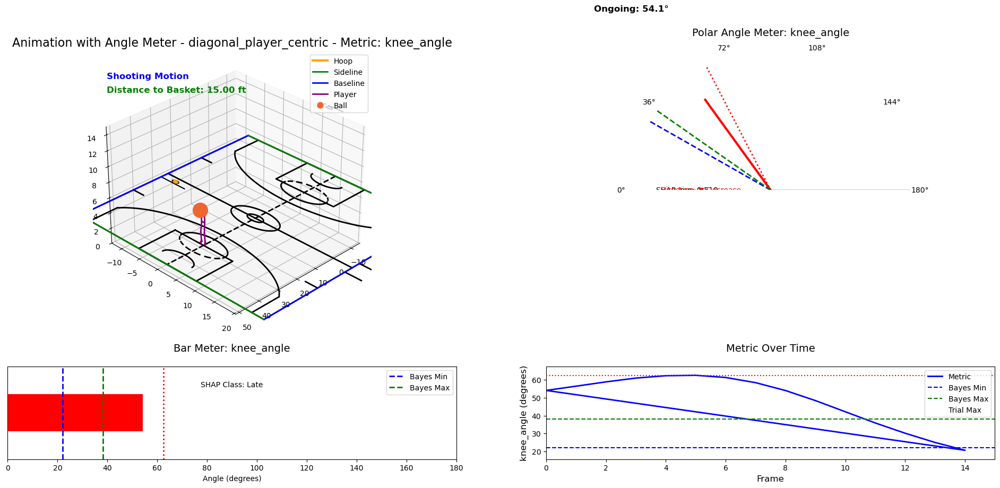

In [19]:
# Calculated, Bayesian, and SHAP feedback logic in `update_meter_with_mode`.
"""
Updated to unify calculated, bayesian, and shap feedback logic in `update_meter_with_mode`.
Introduces a polar subplot for the angle meter with angular ticks and a dynamic line graph.
"""

import logging
import pandas as pd
import json
from IPython.display import HTML, display
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from matplotlib.lines import Line2D
from matplotlib.gridspec import GridSpec
from mpl_toolkits.mplot3d.art3d import Poly3DCollection
from mplbasketball.court3d import Court3D, draw_court_3d
import matplotlib as mpl
import numpy as np

from animate.court import draw_court, get_hoop_position
from animate.viewpoints import get_viewpoint
from matplotlib.patches import Wedge

# Configure logging
logger = logging.getLogger('bayes_animate')
if not logger.hasHandlers():
    logger.setLevel(logging.DEBUG)  # Set to DEBUG to capture all logs
    handler = logging.StreamHandler()
    formatter = logging.Formatter('%(asctime)s - %(levelname)s - %(message)s')
    handler.setFormatter(formatter)
    logger.addHandler(handler)

# Increase the animation embed limit to 30 MB
mpl.rcParams['animation.embed_limit'] = 30.0  # Value is in MB

# Define calculated metrics list
CALCULATED_METRICS = [
    'release_knee_angle',
    'release_wrist_angle',
    'release_elbow_angle',
    'wrist_max_angle',
    'elbow_max_angle',
    'knee_max_angle'
]

# Define paths with placeholders for timestamps
bayesian_metrics_json_path = "../../data/model/shot_meter_docs/bayesian_metrics_dict.json"
merged_data_path = "../../data/model/shot_meter_docs/bayesian_shot_meter_granular_dataset_with_predictions_and_shap.csv"

def load_bayesian_metrics_dict(
    json_path: str,
    debug: bool = False
) -> dict:
    """
    Load the Bayesian metrics dictionary from a JSON file.

    Parameters:
        json_path (str): Path to the JSON file.
        debug (bool): Whether to print debug information. Default is False.

    Returns:
        dict: Bayesian metrics dictionary without 'filter_name'.
    """
    try:
        with open(json_path, 'r') as f:
            bayesian_metrics_dict = json.load(f)
        
        if debug:
            logger.debug(f"Loaded Bayesian metrics dictionary from {json_path}")
            logger.debug(json.dumps(bayesian_metrics_dict, indent=4))
        return bayesian_metrics_dict
    except FileNotFoundError:
        logger.error(f"Bayesian metrics JSON file not found at {json_path}")
        raise
    except json.JSONDecodeError:
        logger.error(f"JSON decoding failed for file {json_path}")
        raise

def generate_feedback_table_all_metrics(feedback_mode, bayesian_metrics_dict, trial_data):
    """
    Generates a comprehensive feedback table for all metrics based on the feedback mode.

    Parameters:
        feedback_mode (str): The mode of feedback ('bayesian', 'shap', 'calculated').
        bayesian_metrics_dict (dict): Dictionary containing Bayesian metrics for all selected metrics.
        trial_data (pd.DataFrame): DataFrame containing the trial data.

    Returns:
        pd.DataFrame: A DataFrame containing the feedback data for all metrics.
    """
    try:
        feedback_records = []

        for metric_key, metric_info in bayesian_metrics_dict.items():
            selected_metric = metric_key  # e.g., 'release_ball_direction_x'
            filter_name = metric_info.get('filter_name', selected_metric)

            # Assign both metric_key and filter_name
            record = {
                'Metric_Key': metric_key,
                'Ongoing Metric Name': filter_name
            }
            logger.debug(f"Processing metric: {metric_key} (Filter: {filter_name})")


            # Define columns based on feedback mode
            if feedback_mode.lower() == "bayesian":
                columns = {
                    'bayes_classification': f"{selected_metric}_bayes_classification",
                    'bayes_optimized': f"{selected_metric}_bayes_optimized",
                    'bayes_max': f"{selected_metric}_bayes_max",
                    'bayes_min': f"{selected_metric}_bayes_min",
                    'shap_importance': f"shap_{selected_metric}_importance"
                }
            elif feedback_mode.lower() == "shap":
                columns = {
                    'shap_unit_change': f"shap_{selected_metric}_unit_change",
                    'shap_unit': f"shap_{selected_metric}_unit",
                    'shap_direction': f"shap_{selected_metric}_direction",
                    'shap_importance': f"shap_{selected_metric}_importance",
                    'shap_goal': f"shap_{selected_metric}_goal",
                    'shap_min': f"shap_{selected_metric}_min",
                    'shap_max': f"shap_{selected_metric}_max"
                }
            elif feedback_mode.lower() == "calculated":
                columns = {
                    'filtered_optimal_min': f"{selected_metric}_filtered_optimal_min",
                    'filtered_optimal_max': f"{selected_metric}_filtered_optimal_max",
                    'shot_classification': f"{selected_metric}_shot_classification"
                }
            else:
                raise ValueError("Invalid feedback mode selected.")

            # Extract values from trial_data
            for key, col in columns.items():
                if col in trial_data.columns:
                    value = trial_data.at[0, col]  # Assuming first row or modify as needed
                    record[key] = value
                    logger.debug(f"  {key}: {value}")
                else:
                    record[key] = np.nan  # Handle missing columns gracefully
                    logger.warning(f"  Missing column: {col}")

            feedback_records.append(record)

        # Convert list of records to DataFrame
        feedback_df = pd.DataFrame(feedback_records)

        logger.debug("Feedback table generated successfully.")
        logger.debug(feedback_df.head())

        return feedback_df

    except Exception as e:
        logger.error(f"Error in generate_feedback_table_all_metrics: {e}")
        raise


def add_bayes_optimal_lines(
    ax: plt.Axes,
    min_angle: float,
    max_angle: float,
    feedback_mode: str = None,  # new
    debug: bool = False
) -> None:
    """
    Add optimal min and max lines to the angle meter, including release min and max angles.
    """
    try:
        # Convert angles to radians
        min_angle_rad = min_angle * np.pi / 180
        max_angle_rad = max_angle * np.pi / 180

        # Check if lines already exist
        if not hasattr(ax, 'optimal_min_line'):
            ax.optimal_min_line, = ax.plot(
                [0, min_angle_rad], [0, 1], color='blue', lw=2, linestyle="--", label='Bayes Min'
            )
        if not hasattr(ax, 'optimal_max_line'):
            ax.optimal_max_line, = ax.plot(
                [0, max_angle_rad], [0, 1], color='green', lw=2, linestyle="--", label='Bayes Max'
            )

        if debug:
            logger.debug(
                f"Added optimal lines at {min_angle}°, {max_angle}° with labels 'Bayes Min' and 'Bayes Max'."
            )
    except Exception as e:
        logger.error(f"Error in add_bayes_optimal_lines: {e}")
        raise

def add_bayes_optimal_lines_to_bar(ax_bar, min_val, max_val, debug=False):
    """
    Draw dashed vertical lines on a bar meter to indicate Bayesian min/max angles.
    """
    try:
        # If lines don’t exist, create them:
        if not hasattr(ax_bar, 'bar_min_line'):
            ax_bar.bar_min_line = ax_bar.axvline(
                x=min_val, color='blue', lw=2, linestyle='--', label='Bayes Min'
            )
        if not hasattr(ax_bar, 'bar_max_line'):
            ax_bar.bar_max_line = ax_bar.axvline(
                x=max_val, color='green', lw=2, linestyle='--', label='Bayes Max'
            )
        if debug:
            logger.debug(f"Added bar min/max lines at {min_val} and {max_val}.")
    except Exception as e:
        logger.error(f"Error in add_bayes_optimal_lines_to_bar: {e}")
        raise

def initialize_bayes_elements(
    ax: plt.Axes,
    connections: list,
    player_color: str,
    player_lw: float,
    ball_color: str,
    ball_size: float,
    debug: bool = False
) -> (dict, plt.Line2D, plt.Text, plt.Text, plt.Text):
    """
    Initialize plot elements such as lines for the player skeleton and the ball.
    """
    try:
        # Initialize lines for each body connection
        lines = {connection: ax.plot([], [], [], c=player_color, lw=player_lw)[0] for connection in connections}
        
        # Initialize the ball as a point
        ball, = ax.plot([], [], [], "o", markersize=ball_size, c=ball_color)
        
        # Text elements for annotations
        release_text = ax.text2D(0.05, 0.95, "", transform=ax.transAxes, color="red", fontsize=14, weight="bold")
        motion_text = ax.text2D(0.05, 0.90, "", transform=ax.transAxes, color="blue", fontsize=12, weight="bold")
        
        # New text element for distance (positioned below motion_text)
        distance_text = ax.text2D(0.05, 0.85, "", transform=ax.transAxes, color="green", fontsize=12, weight="bold")
        
        if debug:
            logger.debug("Elements initialized (lines, ball, text labels).")
        
        return lines, ball, release_text, motion_text, distance_text
    except Exception as e:
        logger.error(f"Error initializing elements: {e}")
        raise

def update_bayes_frame(
    ax: plt.Axes,
    frame: int,
    df: pd.DataFrame,
    release_frame: int,
    lines: dict,
    ball: plt.Line2D,
    release_text: plt.Text,
    motion_text: plt.Text,
    connections: list,
    ball_color: str,
    highlight_color: str,
    debug: bool = False
):
    """
    Update the player's skeleton, ball position, and annotations for each frame.
    """
    try:
        # Update lines based on player joint positions
        for connection in connections:
            joint_start, joint_end = connection
            x_start = df.at[frame, f"{joint_start}_x"]
            y_start = df.at[frame, f"{joint_start}_y"]
            z_start = df.at[frame, f"{joint_start}_z"]
            x_end = df.at[frame, f"{joint_end}_x"]
            y_end = df.at[frame, f"{joint_end}_y"]
            z_end = df.at[frame, f"{joint_end}_z"]
            lines[connection].set_data([x_start, x_end], [y_start, y_end])
            lines[connection].set_3d_properties([z_start, z_end])
        
        # Update ball position
        ball_x = df.at[frame, "ball_x"]
        ball_y = df.at[frame, "ball_y"]
        ball_z = df.at[frame, "ball_z"]
        ball.set_data([ball_x], [ball_y])
        ball.set_3d_properties([ball_z])
        
        # Update annotations
        if frame == release_frame:
            release_text.set_text("Release Point")
            release_text.set_color(highlight_color)
        else:
            release_text.set_text("")
        
        if df.at[frame, "shooting_motion"] == 1:
            motion_text.set_text("Shooting Motion")
        else:
            motion_text.set_text("")
        
        if debug:
            logger.debug(f"Updated frame {frame}: Player and ball positions updated.")
    except Exception as e:
        logger.error(f"Error updating frame {frame}: {e}")
        raise

def update_meter_with_mode(
    ax_meter,
    df,
    frame,
    needle,
    angle_text,
    classification_text,
    shap_importance_text,
    shap_direction_text,
    angle_key: str,
    feedback_key: str,  # Feedback metric (selected_metric)
    feedback_mode: str = "calculated",
    bayesian_metrics_dict: dict = None,
    debug=False,
    # *** NEW ***
    conditional_max: bool = False  # Toggle for conditional max line display
):
    """
    Update the angle meters based on the chosen feedback mode.

    Parameters:
        ax_meter: Matplotlib Axes for the polar angle meter.
        df: DataFrame containing frame data.
        frame: Current frame index.
        needle: Needle Line2D object in the polar meter.
        angle_text: Text object for displaying the current angle.
        classification_text: Text object for classification information.
        shap_importance_text: Text object for SHAP importance.
        shap_direction_text: Text object for SHAP direction.
        angle_key: Column name in df representing the angle (filter_name).
        feedback_key: Column name in df representing the feedback metric (selected_metric).
        feedback_mode: Mode of feedback ('calculated', 'bayesian', 'shap').
        bayesian_metrics_dict: Dictionary containing Bayesian metrics.
        debug: Boolean indicating whether to log debug information.
        conditional_max: If True, max lines are displayed only when ongoing angle >= max.
    """
    try:
        # **Step 4: Remove Old Lines**
        # Ensures only current feedback mode's lines are displayed
        for line_attr in ['calc_min_line', 'calc_max_line',
                          'bayes_min_line', 'bayes_max_line',
                          'shap_min_line', 'shap_max_line']:
            if hasattr(ax_meter, line_attr):
                old_line = getattr(ax_meter, line_attr)
                old_line.remove()
                delattr(ax_meter, line_attr)
                if debug:
                    logger.debug(f"Removed existing line: {line_attr}")

        # Retrieve metric information based on feedback_key
        metric_info = bayesian_metrics_dict.get(feedback_key.lower(), {}) if bayesian_metrics_dict else {}
        current_angle_degs = df.loc[frame, angle_key]
        rad = current_angle_degs * np.pi / 180.0  # Convert to radians

        # Update the needle position
        needle.set_data([rad, rad], [0, 0.8])
        angle_text.set_text(f"Ongoing: {current_angle_degs:.1f}°")

        # Update the gauge fill wedge to represent the ongoing angle
        if hasattr(ax_meter, 'gauge_fill'):
            # Depending on feedback mode, adjust the starting angle of the fill
            if feedback_mode.lower() == "bayesian":
                bayes_min = metric_info.get("bayes_min", 0)
                ax_meter.gauge_fill.theta1 = bayes_min  # Start fill from bayes_min
            elif feedback_mode.lower() == "calculated":
                calc_min_col = f"{feedback_key}_filtered_optimal_min"
                calc_min = df.loc[frame, calc_min_col] if calc_min_col in df.columns else 0
                ax_meter.gauge_fill.theta1 = calc_min  # Start fill from calculated min
            elif feedback_mode.lower() == "shap":
                shap_min_col = f"shap_{feedback_key}_min"
                shap_min = df.loc[frame, shap_min_col] if shap_min_col in df.columns else 0
                ax_meter.gauge_fill.theta1 = shap_min  # Start fill from SHAP min
            else:
                ax_meter.gauge_fill.theta1 = 0  # Default start
            ax_meter.gauge_fill.theta2 = current_angle_degs  # Fill up to current angle
            if debug:
                logger.debug(f"Gauge fill updated: theta1={ax_meter.gauge_fill.theta1}°, theta2={current_angle_degs}°.")

        # **Handle Feedback Modes**
        if feedback_mode.lower() == "calculated":
            # Access calculated min and max columns
            calc_min_col = f"{feedback_key}_filtered_optimal_min"
            calc_max_col = f"{feedback_key}_filtered_optimal_max"
            calc_class_col = f"{feedback_key}_shot_classification"

            # Plot Calculated Min Line
            if calc_min_col in df.columns:
                calc_min = df.loc[frame, calc_min_col]
                calc_min_rad = calc_min * np.pi / 180.0
                ax_meter.calc_min_line, = ax_meter.plot(
                    [0, calc_min_rad], [0, 1],
                    color='blue', lw=2, linestyle='--', label='Calculated Min'
                )
                if debug:
                    logger.debug(f"Added Calculated Min line at {calc_min}°.")

            # Plot Calculated Max Line conditionally
            if calc_max_col in df.columns:
                calc_max = df.loc[frame, calc_max_col]
                if not conditional_max or current_angle_degs >= calc_max:
                    calc_max_rad = calc_max * np.pi / 180.0
                    ax_meter.calc_max_line, = ax_meter.plot(
                        [0, calc_max_rad], [0, 1],
                        color='green', lw=2, linestyle='--', label='Calculated Max'
                    )
                    if debug:
                        logger.debug(f"Added Calculated Max line at {calc_max}°.")

            # Update Classification Text
            if calc_class_col in df.columns:
                calc_classification = df.loc[frame, calc_class_col]
                classification_text.set_text(f"Calculated Class: {calc_classification}")
                if debug:
                    logger.debug(f"Set Calculated Class to {calc_classification}.")
            else:
                classification_text.set_text("Calculated Class: N/A")
                if debug:
                    logger.debug(f"Calculated classification column '{calc_class_col}' not found.")

        elif feedback_mode.lower() == "bayesian":
            # Access Bayesian min and max
            bayes_min = metric_info.get("bayes_min", 0)
            bayes_max = metric_info.get("bayes_max", 180)

            # Plot Bayes Min Line
            ax_meter.bayes_min_line, = ax_meter.plot(
                [0, bayes_min * np.pi / 180.0], [0, 1],
                color='blue', lw=2, linestyle='--', label='Bayes Min'
            )
            if debug:
                logger.debug(f"Added Bayes Min line at {bayes_min}°.")

            # Plot Bayes Max Line conditionally
            if not conditional_max or current_angle_degs >= bayes_max:
                ax_meter.bayes_max_line, = ax_meter.plot(
                    [0, bayes_max * np.pi / 180.0], [0, 1],
                    color='green', lw=2, linestyle='--', label='Bayes Max'
                )
                if debug:
                    logger.debug(f"Added Bayes Max line at {bayes_max}°.")

            # Update Classification Text
            bayes_classification = metric_info.get("bayes_classification", "N/A")
            classification_text.set_text(f"Bayes Class: {bayes_classification}")
            if debug:
                logger.debug(f"Set Bayes Class to {bayes_classification}.")

        elif feedback_mode.lower() == "shap":
            # Access SHAP min and max columns
            shap_min_col = f"shap_{feedback_key}_min"
            shap_max_col = f"shap_{feedback_key}_max"
            shap_class_col = f"shap_{feedback_key}_classification"
            shap_dir_col = f"shap_{feedback_key}_direction"
            shap_imp_col = f"shap_{feedback_key}_importance"

            # Plot SHAP Min Line
            if shap_min_col in df.columns:
                shap_min = df.loc[frame, shap_min_col]
                shap_min_rad = shap_min * np.pi / 180.0
                ax_meter.shap_min_line, = ax_meter.plot(
                    [0, shap_min_rad], [0, 1],
                    color='blue', lw=2, linestyle='--', label='SHAP Min'
                )
                if debug:
                    logger.debug(f"Added SHAP Min line at {shap_min}°.")

            # Plot SHAP Max Line conditionally
            if shap_max_col in df.columns:
                shap_max = df.loc[frame, shap_max_col]
                if not conditional_max or current_angle_degs >= shap_max:
                    shap_max_rad = shap_max * np.pi / 180.0
                    ax_meter.shap_max_line, = ax_meter.plot(
                        [0, shap_max_rad], [0, 1],
                        color='green', lw=2, linestyle='--', label='SHAP Max'
                    )
                    if debug:
                        logger.debug(f"Added SHAP Max line at {shap_max}°.")

            # Update Classification Text
            if shap_class_col in df.columns:
                shap_classification = df.loc[frame, shap_class_col]
                classification_text.set_text(f"SHAP Class: {shap_classification}")
                if debug:
                    logger.debug(f"Set SHAP Class to {shap_classification}.")
            else:
                classification_text.set_text("SHAP Class: N/A")
                if debug:
                    logger.debug(f"SHAP classification column '{shap_class_col}' not found.")

            # Update SHAP Direction Text
            if shap_dir_col in df.columns:
                direction = df.loc[frame, shap_dir_col]
                if isinstance(direction, str):
                    dir_lower = direction.lower()
                    if dir_lower == "increase":
                        shap_direction_text.set_text("Direction: ▲ Increase")
                        shap_direction_text.set_color("green")
                    elif dir_lower == "decrease":
                        shap_direction_text.set_text("Direction: ▼ Decrease")
                        shap_direction_text.set_color("red")
                    else:
                        shap_direction_text.set_text("Direction: N/A")
                        shap_direction_text.set_color("black")
                    if debug:
                        logger.debug(f"Set SHAP Direction to '{direction}'.")
                else:
                    shap_direction_text.set_text("Direction: N/A")
                    if debug:
                        logger.debug("SHAP Direction value is not a string.")
            else:
                shap_direction_text.set_text("Direction: N/A")
                if debug:
                    logger.debug(f"SHAP direction column '{shap_dir_col}' not found.")

            # Update SHAP Importance Text
            if shap_imp_col in df.columns:
                shap_imp = df.loc[frame, shap_imp_col]
                if pd.notna(shap_imp):
                    shap_importance_text.set_text(f"SHAP Imp: {shap_imp:.3f}")
                    if debug:
                        logger.debug(f"Set SHAP Importance to {shap_imp:.3f}.")
                else:
                    shap_importance_text.set_text("SHAP Imp: N/A")
                    if debug:
                        logger.debug("SHAP Importance value is NaN.")
            else:
                shap_importance_text.set_text("SHAP Imp: N/A")
                if debug:
                    logger.debug(f"SHAP importance column '{shap_imp_col}' not found.")

        else:
            logger.warning(f"Unknown feedback mode: {feedback_mode}")
            classification_text.set_text("Class: N/A")
            shap_importance_text.set_text("SHAP: N/A")
            shap_direction_text.set_text("Direction: N/A")
            if debug:
                logger.debug("Set default classification and SHAP texts to N/A.")

        if debug:
            logger.debug(f"Frame={frame}, feedback_mode='{feedback_mode}' => angle={current_angle_degs:.1f}°")

    except Exception as e:
        logger.error(f"Error in update_meter_with_mode: {e}")
        raise

def initialize_bar_meter(ax_bar, min_val, max_val):
    """
    Initializes a horizontal bar to represent the angle from min_val to max_val.
    Returns the bar container so you can update it each frame.
    """
    ax_bar.set_xlim([min_val, max_val])
    ax_bar.set_ylim([-0.5, 0.5])  # Just enough space for a single bar
    ax_bar.set_xlabel("Angle (degrees)")
    ax_bar.set_yticks([])

    # Draw a single bar initially at zero
    bar_container = ax_bar.barh(
        y=0, width=0, height=0.4, color='red', align='center'
    )

    return bar_container

def update_bar_meter(bar_container, current_angle, min_val=0, max_val=180):
    """
    Updates the bar's width so that it visually represents the `current_angle`.
    """
    # bar_container is usually a list with a single bar (bar_container[0])
    bar = bar_container[0]
    
    # Constrain/clip angle if needed (optional).
    clipped_angle = max(min_val, min(current_angle, max_val))
    
    # Update the bar width
    bar.set_width(clipped_angle)

def initialize_line_graph(
    ax_line,
    bayes_min,
    bayes_max,
    selected_metric: str,
    debug=False
):
    """
    Initialize the line graph subplot with dynamic metric tracking.
    """
    try:
        # Set titles and labels
        ax_line.set_title("Metric Over Time", fontsize=14, pad=20)
        ax_line.set_xlabel("Frame", fontsize=12)
        ax_line.set_ylabel(f"{selected_metric} (degrees)", fontsize=12)

        # Initialize the dynamic line
        line_metric, = ax_line.plot([], [], lw=2, color='blue', label='Metric')

        # Initialize min and max lines
        line_min = ax_line.axhline(y=bayes_min, color='blue', linestyle='--', label='Bayes Min')
        line_max = ax_line.axhline(y=bayes_max, color='green', linestyle='--', label='Bayes Max')

        # Initialize the optional trial max line (initially invisible)
        line_trial_max, = ax_line.plot([], [], lw=2, color='red', linestyle='--', label='Trial Max')
        line_trial_max.set_visible(False)

        # Initialize data lists
        data_frames = []
        data_values = []

        # Initialize current y-axis limits with padding
        initial_min = bayes_min - 5
        initial_max = bayes_max + 5
        ax_line.set_ylim(initial_min, initial_max)

        # Add legend
        ax_line.legend(loc='upper right')

        if debug:
            logger.debug("Line graph initialized with dynamic metric tracking.")

        return {
            'line_metric': line_metric,
            'line_min': line_min,
            'line_max': line_max,
            'line_trial_max': line_trial_max,
            'data_frames': data_frames,
            'data_values': data_values,
            'current_ymin': initial_min,
            'current_ymax': initial_max,
            'current_trial_max': bayes_max,  # Initialize with bayes_max
            'trial_max_reached': False  # Flag to track if trial max has been reached
        }
    except Exception as e:
        logger.error(f"Error initializing line graph: {e}")
        raise

def animate_trial_with_calc_bayes_shap_angle_meter(
    df: pd.DataFrame,
    release_frame: int,
    selected_metric: str,
    bayesian_metrics_dict: dict,
    feedback_mode: str = "bayesian",
    viewpoint_name: str = "side_view_right",
    connections: list = None,
    zlim: float = 15.0,
    player_color: str = "purple",
    player_lw: float = 2.0,
    ball_color: str = "#ee6730",
    ball_size: float = 20.0,
    highlight_color: str = "red",
    show_court: bool = True,
    court_type: str = "nba",
    units: str = "ft",
    notebook_mode: bool = True,
    debug: bool = False,
    frames_to_animate: list = None,
    # **New Toggle Arguments**
    show_trial_max_in_polar: bool = True,
    show_trial_max_in_bar: bool = True,
    show_trial_max_in_line: bool = True,
    show_bar_meter: bool = True  # <--- Added toggle parameter
) -> HTML:
    """
    Animate a basketball trial with integrated angle and line meters using bayesian_metrics_dict.
    Supports 'calculated', 'bayesian', or 'shap' feedback via `feedback_mode`.
    Includes optional "Trial Max" lines in polar angle meter, bar meter, and line graph.
    
    Parameters:
         (existing parameters)
        show_bar_meter (bool): Toggle to display the bar meter subplot. Default is True.
    """

    try:
        if connections is None:
            logger.error("No connections provided for player skeleton.")
            raise ValueError("Connections list cannot be None.")

        if debug:
            logger.debug("Starting animation setup.")
            logger.debug(f"Total frames in DataFrame: {len(df)}")
            logger.debug(f"Release frame index provided: {release_frame}")
            logger.debug(f"Selected viewpoint: {viewpoint_name}")
            logger.debug(f"Selected metric for angle meter: {selected_metric}")

        # **Retrieve Elevation and Azimuth Based on Viewpoint Name**
        try:
            viewpoint = get_viewpoint(viewpoint_name)
            elev = viewpoint['elev']
            azim = viewpoint['azim']
            if debug:
                logger.debug(f"Retrieved viewpoint '{viewpoint_name}': elev={elev}, azim={azim}")
        except KeyError:
            logger.error(f"Invalid viewpoint_name: {viewpoint_name}. Using default viewpoint.")
            viewpoint = get_viewpoint("side_view_right")  # Fallback to default
            elev = viewpoint['elev']
            azim = viewpoint['azim']
            if debug:
                logger.debug(f"Using default viewpoint '{viewpoint['name']}': elev={elev}, azim={azim}")

        # **Plot Setup with GridSpec**
        fig = plt.figure(figsize=(24, 10))  # Adjusted height for GridSpec
        gs = GridSpec(2, 2, figure=fig, height_ratios=[3, 1])

        ax_3d = fig.add_subplot(gs[0, 0], projection='3d')  # 3D plot
        ax_meter = fig.add_subplot(gs[0, 1], polar=True)    # Polar Angle Meter
        ax_bar = fig.add_subplot(gs[1, 0])                 # Bar Meter
        ax_line = fig.add_subplot(gs[1, 1])                # Line Graph

        ax_3d.view_init(elev=elev, azim=azim)
        ax_3d.set_zlim(0, zlim)

        # **Initialize the Gauge Fill Wedge in the polar meter**
        if not hasattr(ax_meter, 'gauge_fill'):
            ax_meter.gauge_fill = Wedge(
                center=(0, 0),       # Center of the polar plot
                r=1.0,               # Radius of the Wedge
                theta1=0,            # Start angle (degrees)
                theta2=0,            # End angle (degrees) - will be updated
                facecolor='red',     # Color of the fill
                alpha=0.3,           # Transparency
                transform=ax_meter.transData  # Ensure correct transformation
            )
            ax_meter.add_patch(ax_meter.gauge_fill)
            if debug:
                logger.debug("Gauge fill Wedge initialized.")

        # **Initialize the Needle**
        needle, = ax_meter.plot([0, 0], [0, 0.8], lw=3, color='red')  # Needle points from center to gauge
        if debug:
            logger.debug("Needle initialized and plotted.")

        # Set z-order so that the Wedge is behind the needle
        ax_meter.gauge_fill.set_zorder(1)
        needle.set_zorder(2)
        if debug:
            logger.debug("Set z-order for gauge_fill and needle.")

        # **Draw Court and Get Hoop Position**
        if show_court:
            draw_court(ax_3d, court_type=court_type, units=units, debug=debug)
            hoop_x, hoop_y, hoop_z = get_hoop_position(court_type=court_type, units=units, debug=debug)
            if debug:
                logger.debug(f"Hoop position retrieved: ({hoop_x}, {hoop_y}, {hoop_z})")
        else:
            hoop_x, hoop_y, hoop_z = None, None, None
            if debug:
                logger.debug("Court not shown. Hoop position set to None.")

        # **Initialize Elements for Animation**
        lines, ball, release_text, motion_text, distance_text = initialize_bayes_elements(
            ax=ax_3d,
            connections=connections,
            player_color=player_color,
            player_lw=player_lw,
            ball_color=ball_color,
            ball_size=ball_size,
            debug=debug
        )

        # **Initialize Angle Meter Using bayesian_metrics_dict**
        # **Use 'filter_name' to select the appropriate metric**
        metric_info = bayesian_metrics_dict.get(selected_metric.lower())
        if not metric_info:
            logger.error(f"Selected metric '{selected_metric}' not found in bayesian_metrics_dict.")
            raise ValueError(f"Selected metric '{selected_metric}' not found in bayesian_metrics_dict.")

        selected_metric_final = metric_info.get('filter_name', selected_metric)
        if debug:
            logger.debug(f"Selected metric based on filter_name: {selected_metric_final}")

        # **Retrieve Bayesian Min and Max from metric_info**
        bayes_min = metric_info.get("bayes_min", 0)
        bayes_max = metric_info.get("bayes_max", 180)

        # **Initialize Polar Angle Meter Subplot**
        ax_meter.set_title(f"Polar Angle Meter: {selected_metric_final}", fontsize=14, pad=20)

        ax_meter.set_theta_offset(np.pi)  # Start the gauge from the bottom
        ax_meter.set_theta_direction(-1)  # Clockwise direction

        # Define ticks (0° to 180°)
        angle_ticks = np.linspace(0, np.pi, 6)  # 0 to 180 degrees in radians
        angle_labels = [f'{int(deg)}°' for deg in np.linspace(0, 180, 6)]
        ax_meter.set_xticks(angle_ticks)
        ax_meter.set_xticklabels(angle_labels)

        # Hide radial labels and grid
        ax_meter.set_yticklabels([])
        ax_meter.grid(False)

        # Draw a semi-circular gauge
        ax_meter.set_ylim(0, 1)  # Set radial limits

        # Mask the lower half of the polar plot
        ax_meter.fill_between(
            np.linspace(np.pi, 2*np.pi, 100),
            0, 1,
            color="white",
            zorder=10
        )
        ax_meter.spines['polar'].set_visible(False)
        ax_meter.plot([0, np.pi], [0, 1], color='black', lw=1)

        if debug:
            logger.debug("Masked the lower half of the polar plot.")

        # **Initialize Text Annotations in ax_meter**
        angle_text = ax_meter.text(
            0.0, 1.15,  # Positioned slightly above the polar meter in axes coordinates
            "", ha='center', va='center', fontsize=12, weight='bold',
            transform=ax_meter.transAxes
        )
        # Add a bounding box behind the text for better readability
        angle_text.set_bbox(dict(facecolor='white', alpha=0.7, edgecolor='none'))

        shap_importance_text = ax_meter.text(0, 0.6, "", ha='center', va='center', fontsize=10)
        shap_direction_text = ax_meter.text(0, 0.5, "", ha='center', va='center', fontsize=10)

        # **Add A/B Testing Note**
        mode_note_text = ax_meter.text(
            0.0, -0.2,  # Positioned below the polar meter in axes coordinates
            "Calculated mode: A/B Testing",
            ha='center', va='center', fontsize=10, color='gray',
            transform=ax_meter.transAxes
        )

        # **Initialize Bar Meter Subplot**
        ax_bar.set_title(f"Bar Meter: {selected_metric_final}", fontsize=14, pad=20)

        # **Initialize the Bar**
        bar_container = initialize_bar_meter(ax_bar, min_val=0, max_val=180)

        # **Add the Bayesian Min/Max Lines to the Bar Meter**
        add_bayes_optimal_lines_to_bar(ax_bar, bayes_min, bayes_max, debug)

        # **Add a Legend to the Bar Meter**
        ax_bar.legend()

        # **Initialize Classification Text in ax_bar**
        classification_text = ax_bar.text(
            0.5, 0.8, "", transform=ax_bar.transAxes, ha='center', va='center', fontsize=10
        )

        # **Initialize the Line Graph Subplot**
        line_graph_obj = initialize_line_graph(
            ax_line=ax_line,
            bayes_min=bayes_min,
            bayes_max=bayes_max,
            selected_metric=selected_metric_final,
            debug=debug
        )

        # **Initialize Angle Meter Object for Easy Reference**
        angle_meter_obj = {
            'ax_meter': ax_meter,
            'needle': needle,
            'angle_text': angle_text,
            'classification_text': classification_text,
            'shap_importance_text': shap_importance_text,
            'shap_direction_text': shap_direction_text
        }

        if debug:
            logger.debug(f"Initialized angle meter for metric '{selected_metric_final}'.")

        # **Calculate Trial Maximum Value for the Selected Metric**
        trial_max = df[selected_metric_final].max()  # Changed to use selected_metric_final directly
        if debug:
            logger.debug(f"Trial max for metric '{selected_metric_final}': {trial_max}")

        # **Compute Axes Limits Based on Player Data and Hoop Position**
        if debug:
            logger.debug("Calculating axes limits to include player and hoop.")

        # Extract all x and y coordinates for the player
        player_x_cols = [col for col in df.columns if col.endswith('_x')]
        player_y_cols = [col for col in df.columns if col.endswith('_y')]

        player_x = df[player_x_cols].values.flatten()
        player_y = df[player_y_cols].values.flatten()

        # Remove NaN values
        player_x = player_x[~np.isnan(player_x)]
        player_y = player_y[~np.isnan(player_y)]

        if len(player_x) == 0 or len(player_y) == 0:
            logger.warning("No player coordinates found. Axes limits may not be set correctly.")

        # Get court parameters
        if show_court:
            court = Court3D(court_type=court_type, units=units)
            court_params = court.court_parameters
        else:
            court_params = {'court_length': 94.0, 'court_width': 50.0}  # Default values

        # Initialize min and max with player coordinates
        x_min = player_x.min() - 10.0 if len(player_x) > 0 else -court_params['court_length']/2
        x_max = player_x.max() + 10.0 if len(player_x) > 0 else court_params['court_length']/2
        y_min = player_y.min() - 10.0 if len(player_y) > 0 else -court_params['court_width']/2
        y_max = player_y.max() + 10.0 if len(player_y) > 0 else court_params['court_width']/2

        # Include hoop position in the limits if court is shown and hoop position is valid
        if show_court and hoop_x is not None and hoop_y is not None:
            x_min = min(x_min, hoop_x - 10.0)
            x_max = max(x_max, hoop_x + 10.0)
            y_min = min(y_min, hoop_y - 10.0)
            y_max = max(y_max, hoop_y + 10.0)
            if debug:
                logger.debug(f"Including hoop position in axes limits.")

        if debug:
            logger.debug(f"Player X range: {player_x.min()} to {player_x.max()}")
            logger.debug(f"Player Y range: {player_y.min()} to {player_y.max()}")
            if show_court:
                logger.debug(f"Hoop position: ({hoop_x}, {hoop_y})")
            logger.debug(f"Using xbuffer: 10.0, ybuffer: 10.0")

        # **Set Fixed Axes Limits for 3D Plot**
        ax_3d.set_xlim([x_min, x_max])
        ax_3d.set_ylim([y_min, y_max])

        if debug:
            logger.debug(f"Set axes limits: x=({x_min}, {x_max}), y=({y_min}, {y_max})")

        # **Set Plot Title to Include Viewpoint Name and Selected Metric**
        ax_3d.set_title(f"Animation with Angle Meter - {viewpoint_name} - Metric: {selected_metric_final}", fontsize=16)
        if debug:
            logger.debug(f"Set plot title to 'Animation with Angle Meter - {viewpoint_name} - Metric: {selected_metric_final}'")

        # **Create Custom Legend Handles for Static Court Features**
        hoop_handle = Line2D([0], [0], color='orange', lw=3, label='Hoop')
        baseline_handle = Line2D([0], [0], color='blue', lw=2, label='Baseline')
        sideline_handle = Line2D([0], [0], color='green', lw=2, label='Sideline')

        # **Create Handles for Dynamic Elements**
        player_handle = Line2D([0], [0], color=player_color, lw=player_lw, label='Player')
        ball_handle = Line2D([0], [0], marker='o', color='w', label='Ball',
                             markerfacecolor=ball_color, markersize=10)

        # **Add Legend with Both Static and Dynamic Elements**
        ax_3d.legend(handles=[
            hoop_handle,        # Hoop in orange
            sideline_handle,    # Sideline in green
            baseline_handle,    # Baseline in blue
            player_handle,      # Player skeleton in purple
            ball_handle         # Ball in orange
        ], loc='upper right')

        if debug:
            logger.debug("Legend added with static court features and dynamic elements.")

        # **Initialize Angle Meter Object with Both Keys**
        update_meter_with_mode(
            ax_meter=ax_meter,
            df=df,
            frame=0,  # Initial frame; will be updated in animation
            needle=needle,
            angle_text=angle_text,
            classification_text=classification_text,
            shap_importance_text=shap_importance_text,
            shap_direction_text=shap_direction_text,
            angle_key=selected_metric_final,    # filter_name for graph
            feedback_key=selected_metric,       # selected_metric for feedback
            feedback_mode=feedback_mode,
            bayesian_metrics_dict=bayesian_metrics_dict,
            debug=debug
        )

        # **Calculate Trial Max**
        trial_max = df[selected_metric_final].max()  # Changed to use selected_metric_final directly
        if debug:
            logger.debug(f"Trial max for metric '{selected_metric_final}': {trial_max}")

        # **Add Trial Max Lines to Polar Meter and Bar Meter if Enabled**
        # **Polar Angle Meter**
        if show_trial_max_in_polar:
            trial_max_rad = trial_max * np.pi / 180.0  # Convert degrees to radians
            if not hasattr(ax_meter, 'trial_max_line'):
                ax_meter.trial_max_line, = ax_meter.plot(
                    [0, trial_max_rad], [0, 1],
                    color='red', linestyle=':', lw=2, label='Trial Max'
                )
                if debug:
                    logger.debug("Trial max line added to polar angle meter.")

        # **Bar Meter**
        if show_trial_max_in_bar:
            if not hasattr(ax_bar, 'bar_trial_max_line'):
                ax_bar.bar_trial_max_line = ax_bar.axvline(
                    x=trial_max,
                    color='red',
                    lw=2,
                    linestyle=':',
                    label='Trial Max'
                )
                if debug:
                    logger.debug("Trial max line added to bar meter.")

        # **Initialize Line Graph with Trial Max Line if Enabled**
        if show_trial_max_in_line:
            line_graph_obj['trial_max_line'] = ax_line.axhline(
                y=trial_max,
                color='red',
                linestyle=':',
                label='Trial Max',
                zorder=5  # Ensure visibility above other lines
            )
            if debug:
                logger.debug("Trial max line added to line graph.")

        # **Adjust Y-Limits for Line Graph to Ensure Bayesian Max Visibility**
        ax_line.set_ylim(
            bottom=min(bayes_min, df[selected_metric_final].min() - 5),
            top=max(bayes_max, df[selected_metric_final].max() + 5)
        )
        if debug:
            logger.debug("Adjusted y-limits for line graph to ensure Bayesian max visibility.")

        # **Define the Update Function for Animation**
        def update_func(frame: int):
            """
            Wrapper function for updating the frame in the animation.
            """
            # **Update 3D Elements**
            update_bayes_frame(
                ax=ax_3d,
                frame=frame,
                df=df,
                release_frame=release_frame,
                lines=lines,
                ball=ball,
                release_text=release_text,
                motion_text=motion_text,
                connections=connections,
                ball_color=ball_color,
                highlight_color=highlight_color,
                debug=debug
            )

            # **Update Angle Meter for the Selected Metric**
            if angle_meter_obj:
                # Update the angle meter
                update_meter_with_mode(
                    ax_meter=angle_meter_obj['ax_meter'],
                    df=df,
                    frame=frame,
                    needle=angle_meter_obj['needle'],
                    angle_text=angle_meter_obj['angle_text'],
                    classification_text=classification_text,
                    shap_importance_text=shap_importance_text,
                    shap_direction_text=shap_direction_text,
                    angle_key=selected_metric_final,    # filter_name for graph
                    feedback_key=selected_metric,       # selected_metric for feedback
                    feedback_mode=feedback_mode,
                    bayesian_metrics_dict=bayesian_metrics_dict,
                    debug=debug
                )
            else:
                if debug:
                    logger.debug("No angle meter initialized for the selected metric.")

            # **Update the Bar Meter**
            current_angle = df.loc[frame, selected_metric_final]  # Use filter_name for angle
            update_bar_meter(
                bar_container=bar_container,
                current_angle=current_angle,
                min_val=0,
                max_val=180
            )

            # **Update the Distance Text if Available**
            if 'distance_to_basket' in df.columns:
                distance = df.at[frame, 'distance_to_basket']
                if not pd.isna(distance):
                    distance_text.set_text(f"Distance to Basket: {distance:.2f} ft")
                else:
                    distance_text.set_text("")
            else:
                distance_text.set_text("")

            # **Update the Line Graph**
            frame_number = frame  # Assuming frame corresponds to frame index
            metric_value = df.loc[frame, selected_metric_final]  # Use filter_name for metric

            # Append data
            line_graph_obj['data_frames'].append(frame_number)
            line_graph_obj['data_values'].append(metric_value)

            # Update the dynamic metric line
            line_graph_obj['line_metric'].set_data(line_graph_obj['data_frames'], line_graph_obj['data_values'])

            # Adjust the x-axis limit if necessary
            ax_line.set_xlim(left=0, right=max(line_graph_obj['data_frames']) + 1)

            # **Dynamic Y-Axis Adjustment**
            current_min = min(line_graph_obj['data_values']) - 5
            current_max = max(line_graph_obj['data_values']) + 5

            # Update y-axis limits if necessary
            if current_min < line_graph_obj['current_ymin'] or current_max > line_graph_obj['current_ymax']:
                new_ymin = min(line_graph_obj['current_ymin'], current_min)
                new_ymax = max(line_graph_obj['current_ymax'], current_max)
                ax_line.set_ylim(new_ymin, new_ymax)
                line_graph_obj['current_ymin'] = new_ymin
                line_graph_obj['current_ymax'] = new_ymax
                if debug:
                    logger.debug(f"Y-axis limits updated to ({new_ymin}, {new_ymax})")

            # **Handle the Optional Trial Max Line in Line Graph**
            if show_trial_max_in_line:
                # Check if the current metric_value exceeds the current_trial_max
                if metric_value > line_graph_obj['current_trial_max']:
                    # Update the current_trial_max
                    line_graph_obj['current_trial_max'] = metric_value

                    # Update or create the trial max line
                    if not hasattr(line_graph_obj['line_trial_max'], 'xdata'):
                        # If trial_max_line hasn't been initialized with data
                        line_graph_obj['line_trial_max'].set_data([frame_number], [metric_value])
                    else:
                        # Append the new point to the trial_max_line
                        current_x = line_graph_obj['line_trial_max'].get_xdata()
                        current_y = line_graph_obj['line_trial_max'].get_ydata()
                        new_x = np.append(current_x, frame_number)
                        new_y = np.append(current_y, metric_value)
                        line_graph_obj['line_trial_max'].set_data(new_x, new_y)

                    # Make the trial max line visible
                    line_graph_obj['line_trial_max'].set_visible(True)
                    if debug:
                        logger.debug(f"Trial max updated to {metric_value} at frame {frame_number}.")
            else:
                # Hide the trial max line if the option is disabled
                line_graph_obj['line_trial_max'].set_visible(False)

            # **Redraw the Figure Canvas**
            fig.canvas.draw_idle()

        # **Determine Frames to Use in FuncAnimation**
        if frames_to_animate:
            if debug:
                logger.debug(f"Animating {len(frames_to_animate)} shooting_motion frames.")
            frames = frames_to_animate
        else:
            frames = range(len(df))
            if debug:
                logger.debug("Animating all frames.")

        # **Create and Return Animation**
        anim = FuncAnimation(fig, update_func, frames=frames, interval=1000 / 30, blit=False)

        if notebook_mode:
            if debug:
                logger.debug("Returning animation for notebook display.")
            return HTML(anim.to_jshtml())
        else:
            if debug:
                logger.debug("Returning animation object.")
            return anim

    except json.JSONDecodeError:
        logger.error("Error decoding JSON.")
        raise
    except Exception as e:
        logger.error(f"An unexpected error occurred: {e}")
        raise
    
def display_combined_output(feedback_table, animation_html, feedback_mode):
    """
    Displays the feedback table and animation side by side.

    Parameters:
        feedback_table (pd.DataFrame): The feedback metrics table.
        animation_html (IPython.display.HTML): The animation HTML object.
        feedback_mode (str): The current feedback mode for labeling purposes.
    """
    # Convert Feedback Table to HTML
    feedback_table_html = feedback_table.to_html(index=False)

    # Create an HTML layout to display both the table and the animation side by side
    combined_html = f"""
    <div style="display: flex; justify-content: space-between;">
        <div style="width: 50%;">
            <h3>Feedback Table ({feedback_mode.capitalize()} Mode)</h3>
            {feedback_table_html}
        </div>
        <div style="width: 45%;">
            <h3>Animation</h3>
            {animation_html.data}
        </div>
    </div>
    """

    # Display the combined layout
    display(HTML(combined_html))



# Main execution
if __name__ == "__main__":
    import numpy as np  # Ensure numpy is imported

    # Load bayesian_metrics_dict
    bayesian_metrics_dict = load_bayesian_metrics_dict(
        json_path=bayesian_metrics_json_path,
        debug=True
    )

    # Load merged_data
    merged_data = pd.read_csv(merged_data_path)
    print("columns in merged_data", merged_data.columns.to_list())

    # 1) All SHAP columns (start with shap_)
    shap_columns = [col for col in merged_data.columns if col.startswith("shap_")]

    # 2) "Calculated" columns (the ones that contain _filtered_optimal_ or _shot_classification)
    #    e.g. release_knee_angle_filtered_optimal_min, release_knee_angle_filtered_optimal_max, release_knee_shot_classification, etc.
    calc_minmax_columns = [col for col in merged_data.columns 
                        if "_filtered_optimal_min" in col or "_filtered_optimal_max" in col]

    calc_shot_classif_columns = [col for col in merged_data.columns
                                if col.endswith("_shot_classification")]

    # 3) All Bayesian columns (start or contain _bayes_):
    bayes_columns = [col for col in merged_data.columns if "_bayes_" in col]

    # Print them out
    print("SHAP columns:")
    for col in shap_columns:
        print("   ", col)

    print("\nCalculated min/max columns:")
    for col in calc_minmax_columns:
        print("   ", col)

    print("\nCalculated shot_classification columns:")
    for col in calc_shot_classif_columns:
        print("   ", col)

    print("\nBayesian columns:")
    for col in bayes_columns:
        print("   ", col)

    # **Select trial and metric**
    selected_trial_id = 'T0089'
    selected_metric = 'knee_release_angle'  # Example metric

    # **Filter data for the selected trial**
    trial_data = merged_data[merged_data['trial_id'] == selected_trial_id].sort_values(by='frame_time').reset_index(drop=True)

    # **Retrieve filter_name for the selected_metric**
    metric_info = bayesian_metrics_dict.get(selected_metric.lower())
    if not metric_info:
        logger.error(f"Selected metric '{selected_metric}' not found in bayesian_metrics_dict.")
        raise ValueError(f"Selected metric '{selected_metric}' not found in bayesian_metrics_dict.")

    selected_metric_final = metric_info.get('filter_name', selected_metric)
    logger.debug(f"Selected metric based on filter_name: {selected_metric_final}")

    # Determine release frame
    release_frames = trial_data.index[trial_data["release_point_filter"] == 1].tolist()
    release_frame = release_frames[0] if release_frames else None

    if release_frame is None:
        logger.warning(f"No release frame found for trial_id {selected_trial_id}.")

    # Filter frames where shooting_motion == 1
    shooting_frames = trial_data[trial_data['shooting_motion'] == 1].index.tolist()

    if not shooting_frames:
        logger.warning(f"No shooting_motion frames found for trial_id {selected_trial_id}.")
    else:
        logger.info(f"Number of shooting_motion frames: {len(shooting_frames)}")

    # Ensure release_frame is included in the animation frames
    if release_frame is not None and release_frame not in shooting_frames:
        shooting_frames.append(release_frame)
        logger.info(f"Added release_frame {release_frame} to shooting_frames.")

    # Define connections outside and pass them
    connections = [
        ("R_EYE", "L_EYE"), ("R_EYE", "NOSE"), ("L_EYE", "NOSE"),
        ("R_EYE", "R_EAR"), ("L_EYE", "L_EAR"), ("R_SHOULDER", "L_SHOULDER"),
        ("R_SHOULDER", "R_ELBOW"), ("L_SHOULDER", "L_ELBOW"), ("R_ELBOW", "R_WRIST"),
        ("L_ELBOW", "L_WRIST"), ("R_SHOULDER", "R_HIP"), ("L_SHOULDER", "L_HIP"),
        ("R_HIP", "L_HIP"), ("R_HIP", "R_KNEE"), ("L_HIP", "L_KNEE"),
        ("R_KNEE", "R_ANKLE"), ("L_KNEE", "L_ANKLE"), ("R_WRIST", "R_1STFINGER"),
        ("R_WRIST", "R_5THFINGER"), ("L_WRIST", "L_1STFINGER"), ("L_WRIST", "L_5THFINGER"),
        ("R_ANKLE", "R_1STTOE"), ("R_ANKLE", "R_5THTOE"), ("L_ANKLE", "L_1STTOE"),
        ("L_ANKLE", "L_5THTOE"), ("R_ANKLE", "R_CALC"), ("L_ANKLE", "L_CALC"),
        ("R_1STTOE", "R_5THTOE"), ("L_1STTOE", "L_5THTOE"), ("R_1STTOE", "R_CALC"),
        ("L_1STTOE", "L_CALC"), ("R_5THTOE", "R_CALC"), ("L_5THTOE", "L_CALC"),
        ("R_1STFINGER", "R_5THFINGER"), ("L_1STFINGER", "L_5THFINGER")
    ]

    # **Select Feedback Mode**
    feedback_mode = "shap"  # Options: 'bayesian', 'shap', 'calculated'

    # **Generate Feedback Table for All Metrics**
    feedback_table = generate_feedback_table_all_metrics(
        feedback_mode=feedback_mode,
        bayesian_metrics_dict=bayesian_metrics_dict,
        trial_data=trial_data
    )

    # **Display the Feedback Table and Animation Together**
    # Removed the separate display of the feedback table to prevent duplication
    print("\nFeedback Table:")
    display(feedback_table)

    # **Animate the trial with only shooting_motion frames**
    animation_html = animate_trial_with_calc_bayes_shap_angle_meter(
        df=trial_data,
        release_frame=release_frame,
        selected_metric=selected_metric,
        bayesian_metrics_dict=bayesian_metrics_dict,
        feedback_mode=feedback_mode,  # calculated, bayesian, or shap
        viewpoint_name="diagonal_player_centric",
        connections=connections,
        zlim=15.0,
        player_color="purple",
        player_lw=2.0,
        ball_color="#ee6730",
        ball_size=20.0,
        highlight_color="red",
        show_court=True,
        court_type="nba",
        units="ft",
        notebook_mode=True,
        debug=True,
        frames_to_animate=shooting_frames, 
        show_trial_max_in_polar=True,
        show_trial_max_in_bar=True,
        show_trial_max_in_line=True
    )

    # **Display the Feedback Table and Animation Together**
    display_combined_output(feedback_table, animation_html, feedback_mode)
